In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import os
import torch
import time

import pyro
import pyro.optim as optim
import pyro.poutine as poutine
from pyro.infer import SVI, Trace_ELBO, TraceGraph_ELBO

from bayesian_rnn_experimental import BayesianSequenceModel
from utils.visualize import *

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
# device = torch.device("cpu")

In [5]:
device

device(type='cuda')

In [6]:
root = os.getcwd()
X_train, A_train, Y_train = np.load(root+"/../datasets/vanilla_rnn/train/states.npy"), np.load(root+"/../datasets/vanilla_rnn/train/actions.npy"), np.load(root+"/../datasets/vanilla_rnn/train/next_states.npy")
X_val, A_val, Y_val = np.load(root+"/../datasets/vanilla_rnn/val/states.npy"), np.load(root+"/../datasets/vanilla_rnn/val/actions.npy"), np.load(root+"/../datasets/vanilla_rnn/val/next_states.npy")
X_test, A_test, Y_test = np.load(root+"/../datasets/vanilla_rnn/test/states.npy"), np.load(root+"/../datasets/vanilla_rnn/test/actions.npy"), np.load(root+"/../datasets/vanilla_rnn/test/next_states.npy")

In [7]:
X_train.shape, A_train.shape, Y_train.shape

((160673, 100, 21), (160673, 100, 8), (160673, 100, 21))

In [8]:
X_val.shape, A_val.shape, Y_val.shape

((8927, 100, 21), (8927, 100, 8), (8927, 100, 21))

In [9]:
X_test.shape, A_test.shape, Y_test.shape

((8927, 100, 21), (8927, 100, 8), (8927, 100, 21))

In [10]:
vrnn = BayesianSequenceModel(state_size=21, action_size=8, z_size=32, hidden_state_size=256, device=device).to(device)

In [11]:
vrnn.load_checkpoint(os.getcwd()+"/../models/bayesian_rnn_experimental.pth")

In [12]:
adam = optim.Adam({"lr": 1.0e-3})
elbo = Trace_ELBO()
svi = SVI(vrnn.model, vrnn.guide, adam, loss=elbo)

In [13]:
X_example = torch.from_numpy(X_train[0:5]).to(device)
A_example = torch.from_numpy(A_train[0:5]).to(device)
Y_example = torch.from_numpy(Y_train[0:5]).to(device)

X=torch.from_numpy(X_train[:]).to(device)
A=torch.from_numpy(A_train[:]).to(device)
Y=torch.from_numpy(Y_train[:]).to(device)

t0 = time.time()
epochs = 10000
batch_size = 1600
N = X_train.shape[0]

i=1, epochs=0.01, elapsed=0.00, elbo=38090504010.30 loss=0.42
i=2, epochs=0.02, elapsed=0.00, elbo=37549032507.24 loss=0.42
i=3, epochs=0.03, elapsed=0.00, elbo=37537737760.56 loss=0.41
i=4, epochs=0.04, elapsed=0.00, elbo=37088278808.14 loss=0.41
i=5, epochs=0.05, elapsed=0.00, elbo=36923585361.88 loss=0.41


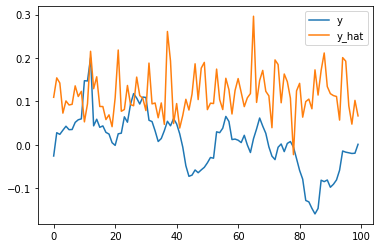

i=6, epochs=0.06, elapsed=0.00, elbo=36501259208.27 loss=0.41
i=7, epochs=0.07, elapsed=0.00, elbo=36130698870.82 loss=0.40
i=8, epochs=0.08, elapsed=0.00, elbo=35726216614.23 loss=0.40
i=9, epochs=0.09, elapsed=0.00, elbo=35251423650.49 loss=0.40
i=10, epochs=0.10, elapsed=0.00, elbo=34781482237.36 loss=0.40


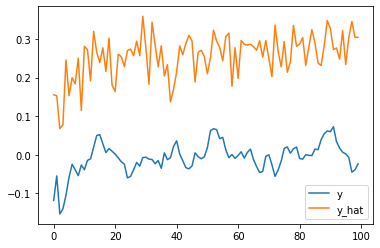

i=11, epochs=0.11, elapsed=0.00, elbo=34225887211.01 loss=0.41
i=12, epochs=0.12, elapsed=0.00, elbo=33670452967.07 loss=0.41
i=13, epochs=0.13, elapsed=0.00, elbo=33086140833.14 loss=0.41
i=14, epochs=0.14, elapsed=0.00, elbo=32646366777.90 loss=0.40
i=15, epochs=0.15, elapsed=0.00, elbo=31995751032.64 loss=0.40


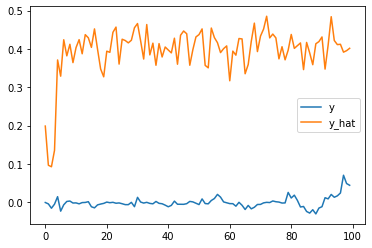

i=16, epochs=0.16, elapsed=0.00, elbo=31428265059.92 loss=0.39
i=17, epochs=0.17, elapsed=0.00, elbo=30874606722.88 loss=0.39
i=18, epochs=0.18, elapsed=0.00, elbo=30621958497.76 loss=0.39
i=19, epochs=0.19, elapsed=0.00, elbo=30343361790.93 loss=0.39
i=20, epochs=0.20, elapsed=0.01, elbo=29807637505.00 loss=0.39


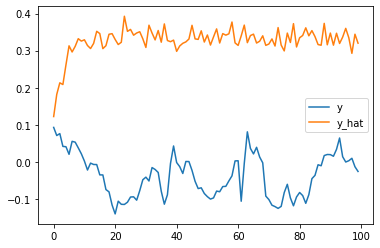

i=21, epochs=0.21, elapsed=0.01, elbo=29238751502.54 loss=0.38
i=22, epochs=0.22, elapsed=0.01, elbo=28806698139.48 loss=0.38
i=23, epochs=0.23, elapsed=0.01, elbo=28433265676.66 loss=0.37
i=24, epochs=0.24, elapsed=0.01, elbo=27886963780.80 loss=0.37
i=25, epochs=0.25, elapsed=0.01, elbo=27362746082.75 loss=0.36


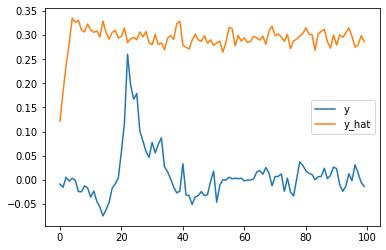

i=26, epochs=0.26, elapsed=0.01, elbo=26872148568.26 loss=0.36
i=27, epochs=0.27, elapsed=0.01, elbo=26322927177.43 loss=0.35
i=28, epochs=0.28, elapsed=0.01, elbo=25808774858.81 loss=0.35
i=29, epochs=0.29, elapsed=0.01, elbo=25090556332.93 loss=0.35
i=30, epochs=0.30, elapsed=0.01, elbo=24477174499.00 loss=0.34


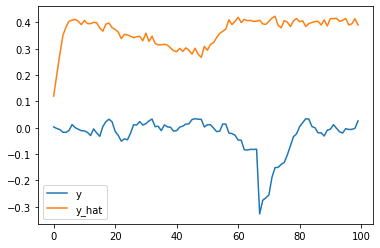

i=31, epochs=0.31, elapsed=0.01, elbo=23992976646.02 loss=0.34
i=32, epochs=0.32, elapsed=0.01, elbo=23349493054.87 loss=0.33
i=33, epochs=0.33, elapsed=0.01, elbo=22621359411.52 loss=0.33
i=34, epochs=0.34, elapsed=0.01, elbo=21939228003.16 loss=0.32
i=35, epochs=0.35, elapsed=0.01, elbo=21376666491.23 loss=0.32


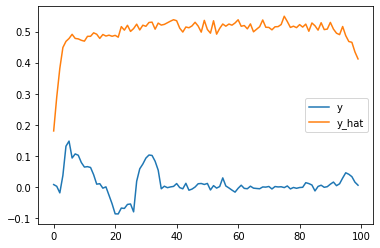

i=36, epochs=0.36, elapsed=0.01, elbo=20672483889.77 loss=0.32
i=37, epochs=0.37, elapsed=0.01, elbo=20150422057.45 loss=0.31
i=38, epochs=0.38, elapsed=0.01, elbo=19724882472.04 loss=0.31
i=39, epochs=0.39, elapsed=0.01, elbo=18943244779.57 loss=0.30
i=40, epochs=0.40, elapsed=0.01, elbo=18537715356.32 loss=0.30


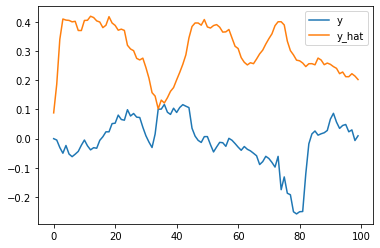

i=41, epochs=0.41, elapsed=0.01, elbo=17860227541.52 loss=0.29
i=42, epochs=0.42, elapsed=0.01, elbo=17328931836.68 loss=0.29
i=43, epochs=0.43, elapsed=0.01, elbo=16939047967.60 loss=0.28
i=44, epochs=0.44, elapsed=0.01, elbo=16573510150.96 loss=0.28
i=45, epochs=0.45, elapsed=0.01, elbo=16065451626.50 loss=0.27


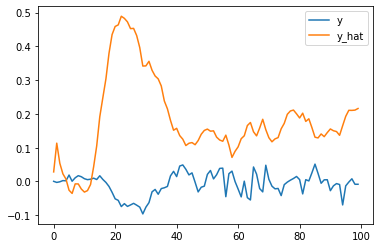

i=46, epochs=0.46, elapsed=0.01, elbo=15442150266.01 loss=0.27
i=47, epochs=0.47, elapsed=0.01, elbo=15031173920.52 loss=0.26
i=48, epochs=0.48, elapsed=0.01, elbo=14556838280.33 loss=0.26
i=49, epochs=0.49, elapsed=0.01, elbo=14238022357.95 loss=0.25
i=50, epochs=0.50, elapsed=0.01, elbo=13715772980.29 loss=0.25


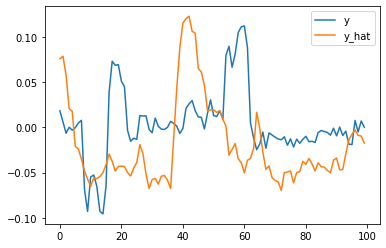

i=51, epochs=0.51, elapsed=0.01, elbo=13083962013.84 loss=0.25
i=52, epochs=0.52, elapsed=0.01, elbo=13213484486.52 loss=0.24
i=53, epochs=0.53, elapsed=0.01, elbo=12623748901.74 loss=0.24
i=54, epochs=0.54, elapsed=0.01, elbo=12133523447.62 loss=0.23
i=55, epochs=0.55, elapsed=0.01, elbo=11942172109.41 loss=0.23


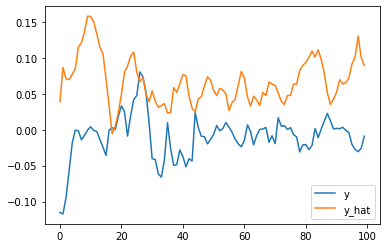

i=56, epochs=0.56, elapsed=0.01, elbo=11610514729.80 loss=0.23
i=57, epochs=0.57, elapsed=0.01, elbo=11432682925.28 loss=0.22
i=58, epochs=0.58, elapsed=0.01, elbo=11097367623.85 loss=0.22
i=59, epochs=0.59, elapsed=0.01, elbo=10712942932.62 loss=0.22
i=60, epochs=0.60, elapsed=0.01, elbo=10652656527.40 loss=0.21


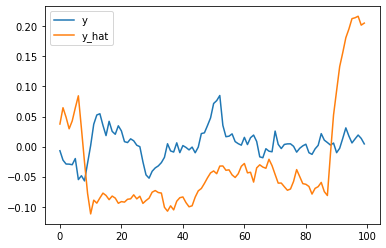

i=61, epochs=0.61, elapsed=0.01, elbo=10230279021.56 loss=0.21
i=62, epochs=0.62, elapsed=0.01, elbo=9969881914.01 loss=0.21
i=63, epochs=0.63, elapsed=0.02, elbo=9751553303.27 loss=0.21
i=64, epochs=0.64, elapsed=0.02, elbo=9649538963.52 loss=0.20
i=65, epochs=0.65, elapsed=0.02, elbo=9438972434.41 loss=0.20


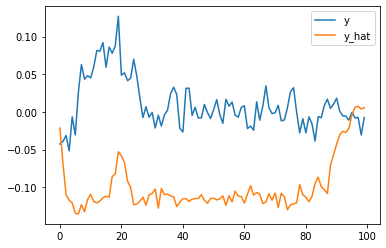

i=66, epochs=0.66, elapsed=0.02, elbo=9375880754.66 loss=0.20
i=67, epochs=0.67, elapsed=0.02, elbo=9101952422.65 loss=0.20
i=68, epochs=0.68, elapsed=0.02, elbo=9002726225.48 loss=0.20
i=69, epochs=0.69, elapsed=0.02, elbo=9087687160.03 loss=0.19
i=70, epochs=0.70, elapsed=0.02, elbo=8872292712.68 loss=0.19


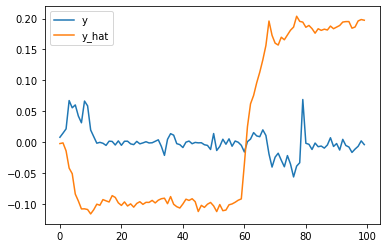

i=71, epochs=0.71, elapsed=0.02, elbo=8774817966.83 loss=0.19
i=72, epochs=0.72, elapsed=0.02, elbo=8650100942.75 loss=0.19
i=73, epochs=0.73, elapsed=0.02, elbo=8405482062.80 loss=0.19
i=74, epochs=0.74, elapsed=0.02, elbo=8444989288.98 loss=0.18
i=75, epochs=0.75, elapsed=0.02, elbo=8343112704.86 loss=0.19


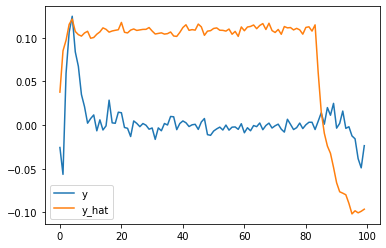

i=76, epochs=0.76, elapsed=0.02, elbo=8155184266.27 loss=0.18
i=77, epochs=0.77, elapsed=0.02, elbo=8172962066.07 loss=0.18
i=78, epochs=0.78, elapsed=0.02, elbo=8056679491.77 loss=0.18
i=79, epochs=0.79, elapsed=0.02, elbo=8031654982.57 loss=0.18
i=80, epochs=0.80, elapsed=0.02, elbo=7832868197.48 loss=0.18


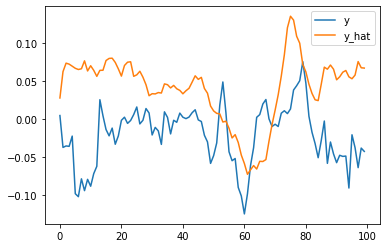

i=81, epochs=0.81, elapsed=0.02, elbo=7835797311.34 loss=0.18
i=82, epochs=0.82, elapsed=0.02, elbo=7960515140.67 loss=0.17
i=83, epochs=0.83, elapsed=0.02, elbo=7576300977.19 loss=0.18
i=84, epochs=0.84, elapsed=0.02, elbo=7715888454.63 loss=0.18
i=85, epochs=0.85, elapsed=0.02, elbo=7663505314.38 loss=0.17


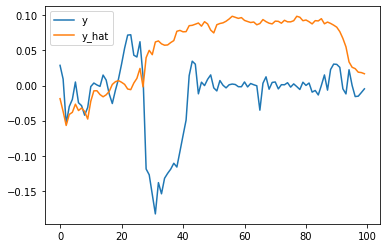

i=86, epochs=0.86, elapsed=0.02, elbo=7394605531.01 loss=0.17
i=87, epochs=0.87, elapsed=0.02, elbo=7544190558.94 loss=0.17
i=88, epochs=0.88, elapsed=0.02, elbo=7464560975.09 loss=0.17
i=89, epochs=0.89, elapsed=0.02, elbo=7344346585.47 loss=0.17
i=90, epochs=0.90, elapsed=0.02, elbo=7299493705.15 loss=0.17


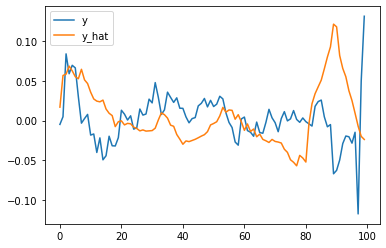

i=91, epochs=0.91, elapsed=0.02, elbo=7356853527.10 loss=0.17
i=92, epochs=0.92, elapsed=0.02, elbo=7349194532.79 loss=0.17
i=93, epochs=0.93, elapsed=0.02, elbo=7336505459.22 loss=0.17
i=94, epochs=0.94, elapsed=0.02, elbo=7289013624.33 loss=0.17
i=95, epochs=0.95, elapsed=0.02, elbo=7224837254.65 loss=0.17


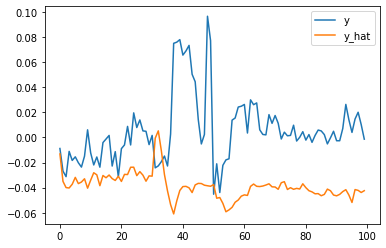

i=96, epochs=0.96, elapsed=0.02, elbo=7277244780.15 loss=0.17
i=97, epochs=0.97, elapsed=0.02, elbo=6990153666.68 loss=0.17
i=98, epochs=0.98, elapsed=0.02, elbo=6986830993.94 loss=0.16
i=99, epochs=0.99, elapsed=0.02, elbo=7039270193.68 loss=0.16
i=100, epochs=1.00, elapsed=0.02, elbo=6968873636.85 loss=0.16


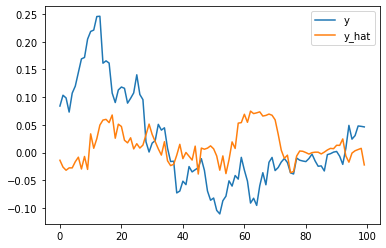

i=101, epochs=1.01, elapsed=0.02, elbo=7029604361.03 loss=0.16
i=102, epochs=1.02, elapsed=0.02, elbo=6958708033.92 loss=0.16
i=103, epochs=1.03, elapsed=0.02, elbo=6930091120.17 loss=0.16
i=104, epochs=1.04, elapsed=0.02, elbo=6755236600.19 loss=0.16
i=105, epochs=1.05, elapsed=0.02, elbo=6805453649.01 loss=0.16


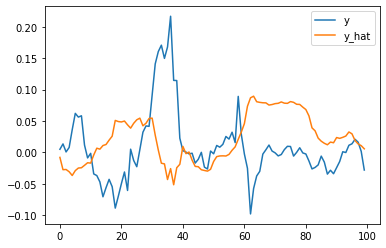

i=106, epochs=1.06, elapsed=0.03, elbo=6820240771.21 loss=0.16
i=107, epochs=1.07, elapsed=0.03, elbo=6722245809.32 loss=0.16
i=108, epochs=1.08, elapsed=0.03, elbo=6952296055.46 loss=0.16
i=109, epochs=1.09, elapsed=0.03, elbo=6818801297.40 loss=0.16
i=110, epochs=1.10, elapsed=0.03, elbo=6756681487.05 loss=0.16


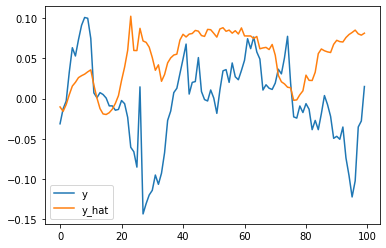

i=111, epochs=1.11, elapsed=0.03, elbo=6676587541.89 loss=0.16
i=112, epochs=1.12, elapsed=0.03, elbo=6585859648.40 loss=0.16
i=113, epochs=1.13, elapsed=0.03, elbo=6578133394.57 loss=0.16
i=114, epochs=1.14, elapsed=0.03, elbo=6558660986.86 loss=0.16
i=115, epochs=1.15, elapsed=0.03, elbo=6536328454.72 loss=0.16


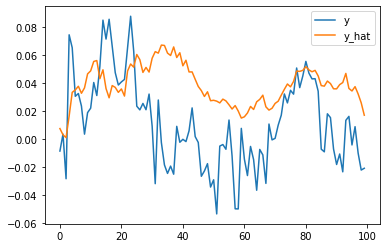

i=116, epochs=1.16, elapsed=0.03, elbo=6653522945.75 loss=0.16
i=117, epochs=1.17, elapsed=0.03, elbo=6549723328.11 loss=0.16
i=118, epochs=1.18, elapsed=0.03, elbo=6582200286.08 loss=0.16
i=119, epochs=1.19, elapsed=0.03, elbo=6505155450.24 loss=0.16
i=120, epochs=1.19, elapsed=0.03, elbo=6578574246.66 loss=0.16


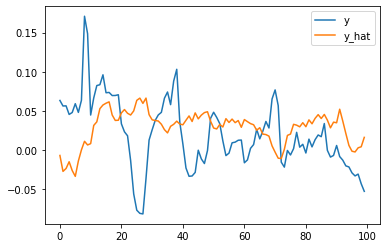

i=121, epochs=1.20, elapsed=0.03, elbo=6418210959.31 loss=0.16
i=122, epochs=1.21, elapsed=0.03, elbo=6266604172.97 loss=0.16
i=123, epochs=1.22, elapsed=0.03, elbo=6477571854.45 loss=0.16
i=124, epochs=1.23, elapsed=0.03, elbo=6364013054.28 loss=0.16
i=125, epochs=1.24, elapsed=0.03, elbo=6492074376.41 loss=0.16


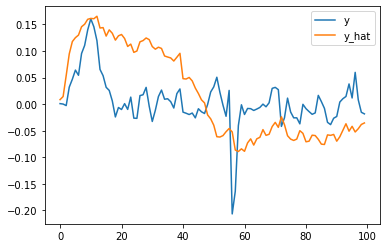

i=126, epochs=1.25, elapsed=0.03, elbo=6285913140.83 loss=0.15
i=127, epochs=1.26, elapsed=0.03, elbo=6330253959.75 loss=0.16
i=128, epochs=1.27, elapsed=0.03, elbo=6325923319.01 loss=0.16
i=129, epochs=1.28, elapsed=0.03, elbo=6248758210.38 loss=0.16
i=130, epochs=1.29, elapsed=0.03, elbo=6146269758.57 loss=0.16


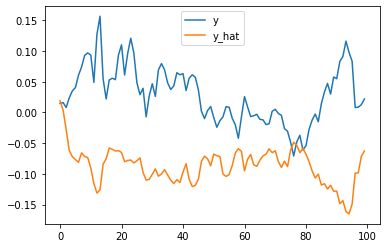

i=131, epochs=1.30, elapsed=0.03, elbo=6231119392.27 loss=0.16
i=132, epochs=1.31, elapsed=0.03, elbo=6176873545.65 loss=0.16
i=133, epochs=1.32, elapsed=0.03, elbo=6159561578.54 loss=0.16
i=134, epochs=1.33, elapsed=0.03, elbo=6011787965.58 loss=0.16
i=135, epochs=1.34, elapsed=0.03, elbo=6104792945.46 loss=0.16


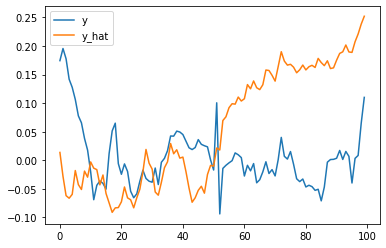

i=136, epochs=1.35, elapsed=0.03, elbo=5922386958.04 loss=0.16
i=137, epochs=1.36, elapsed=0.03, elbo=5924025300.76 loss=0.16
i=138, epochs=1.37, elapsed=0.03, elbo=5970913784.24 loss=0.16
i=139, epochs=1.38, elapsed=0.03, elbo=5918556305.35 loss=0.16
i=140, epochs=1.39, elapsed=0.03, elbo=5905622891.71 loss=0.15


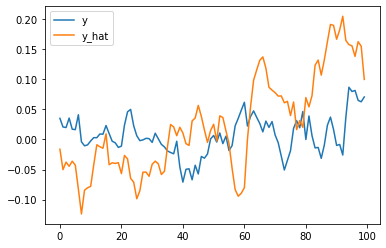

i=141, epochs=1.40, elapsed=0.03, elbo=5789761713.33 loss=0.16
i=142, epochs=1.41, elapsed=0.03, elbo=5887552585.55 loss=0.15
i=143, epochs=1.42, elapsed=0.03, elbo=5651924971.39 loss=0.15
i=144, epochs=1.43, elapsed=0.03, elbo=5868278812.84 loss=0.16
i=145, epochs=1.44, elapsed=0.03, elbo=5728030943.41 loss=0.16


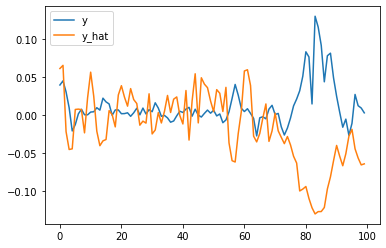

i=146, epochs=1.45, elapsed=0.03, elbo=5859997229.82 loss=0.15
i=147, epochs=1.46, elapsed=0.03, elbo=5604072364.52 loss=0.15
i=148, epochs=1.47, elapsed=0.04, elbo=5763632297.29 loss=0.15
i=149, epochs=1.48, elapsed=0.04, elbo=5717700685.48 loss=0.16
i=150, epochs=1.49, elapsed=0.04, elbo=5946057747.59 loss=0.15


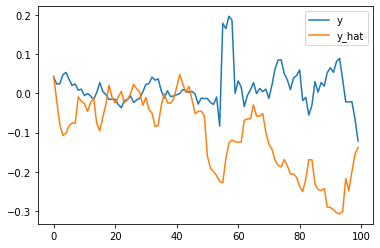

i=151, epochs=1.50, elapsed=0.04, elbo=5796859861.34 loss=0.15
i=152, epochs=1.51, elapsed=0.04, elbo=5699164626.97 loss=0.15
i=153, epochs=1.52, elapsed=0.04, elbo=5633889484.26 loss=0.15
i=154, epochs=1.53, elapsed=0.04, elbo=5672068063.83 loss=0.15
i=155, epochs=1.54, elapsed=0.04, elbo=5407080716.98 loss=0.15


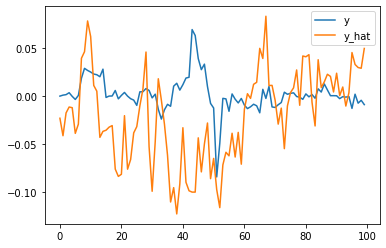

i=156, epochs=1.55, elapsed=0.04, elbo=5579062397.96 loss=0.15
i=157, epochs=1.56, elapsed=0.04, elbo=5559294857.60 loss=0.15
i=158, epochs=1.57, elapsed=0.04, elbo=5645787827.28 loss=0.15
i=159, epochs=1.58, elapsed=0.04, elbo=5468581776.82 loss=0.15
i=160, epochs=1.59, elapsed=0.04, elbo=5629476763.68 loss=0.15


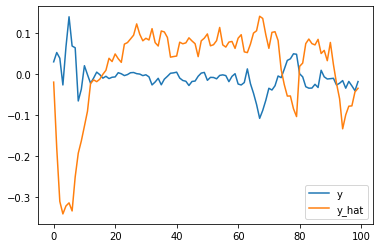

i=161, epochs=1.60, elapsed=0.04, elbo=5430358096.08 loss=0.15
i=162, epochs=1.61, elapsed=0.04, elbo=5521643418.37 loss=0.15
i=163, epochs=1.62, elapsed=0.04, elbo=5513469506.90 loss=0.15
i=164, epochs=1.63, elapsed=0.04, elbo=5442164444.63 loss=0.15
i=165, epochs=1.64, elapsed=0.04, elbo=5455443548.06 loss=0.15


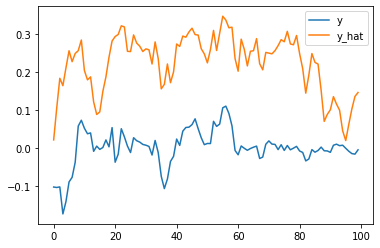

i=166, epochs=1.65, elapsed=0.04, elbo=5396772738.53 loss=0.15
i=167, epochs=1.66, elapsed=0.04, elbo=5433619924.83 loss=0.15
i=168, epochs=1.67, elapsed=0.04, elbo=5497752366.22 loss=0.15
i=169, epochs=1.68, elapsed=0.04, elbo=5506370757.41 loss=0.15
i=170, epochs=1.69, elapsed=0.04, elbo=5520166676.80 loss=0.15


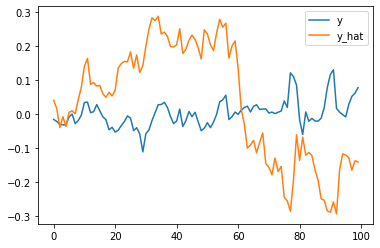

i=171, epochs=1.70, elapsed=0.04, elbo=5350308445.60 loss=0.15
i=172, epochs=1.71, elapsed=0.04, elbo=5284274484.63 loss=0.15
i=173, epochs=1.72, elapsed=0.04, elbo=5325749942.53 loss=0.15
i=174, epochs=1.73, elapsed=0.04, elbo=5299885344.14 loss=0.15
i=175, epochs=1.74, elapsed=0.04, elbo=5299717796.64 loss=0.15


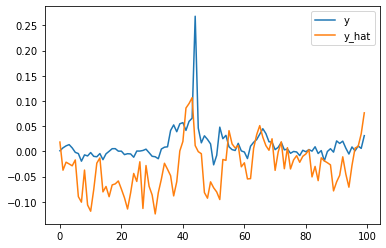

i=176, epochs=1.75, elapsed=0.04, elbo=5310973482.04 loss=0.15
i=177, epochs=1.76, elapsed=0.04, elbo=5220658462.28 loss=0.15
i=178, epochs=1.77, elapsed=0.04, elbo=5298179251.58 loss=0.15
i=179, epochs=1.78, elapsed=0.04, elbo=5347561651.49 loss=0.15
i=180, epochs=1.79, elapsed=0.04, elbo=5159090182.20 loss=0.15


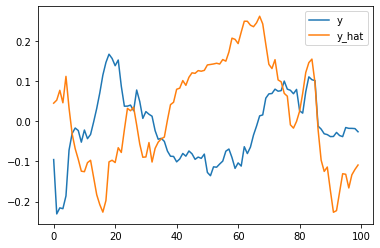

i=181, epochs=1.80, elapsed=0.04, elbo=5325773978.24 loss=0.15
i=182, epochs=1.81, elapsed=0.04, elbo=5306694227.76 loss=0.15
i=183, epochs=1.82, elapsed=0.04, elbo=5172995345.26 loss=0.15
i=184, epochs=1.83, elapsed=0.04, elbo=5289449848.49 loss=0.15
i=185, epochs=1.84, elapsed=0.04, elbo=5077873798.83 loss=0.15


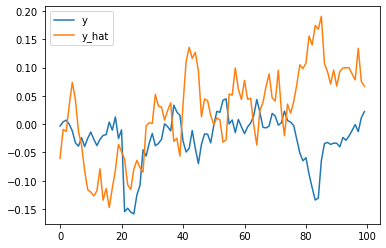

i=186, epochs=1.85, elapsed=0.04, elbo=5257719643.28 loss=0.15
i=187, epochs=1.86, elapsed=0.04, elbo=5300711416.53 loss=0.15
i=188, epochs=1.87, elapsed=0.04, elbo=5068346591.47 loss=0.15
i=189, epochs=1.88, elapsed=0.04, elbo=5079767068.41 loss=0.15
i=190, epochs=1.89, elapsed=0.04, elbo=5240190310.52 loss=0.15


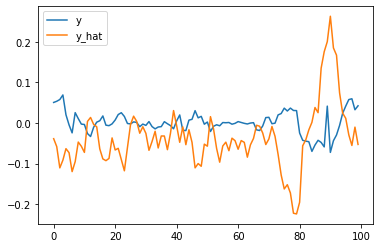

i=191, epochs=1.90, elapsed=0.05, elbo=5070059448.34 loss=0.15
i=192, epochs=1.91, elapsed=0.05, elbo=5111029832.22 loss=0.15
i=193, epochs=1.92, elapsed=0.05, elbo=5116466601.58 loss=0.15
i=194, epochs=1.93, elapsed=0.05, elbo=5154865245.70 loss=0.15
i=195, epochs=1.94, elapsed=0.05, elbo=5252369477.92 loss=0.15


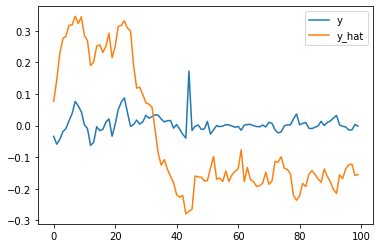

i=196, epochs=1.95, elapsed=0.05, elbo=4998896036.26 loss=0.15
i=197, epochs=1.96, elapsed=0.05, elbo=5321790142.03 loss=0.15
i=198, epochs=1.97, elapsed=0.05, elbo=5104215102.41 loss=0.15
i=199, epochs=1.98, elapsed=0.05, elbo=5185730204.54 loss=0.15
i=200, epochs=1.99, elapsed=0.05, elbo=5090250786.95 loss=0.15


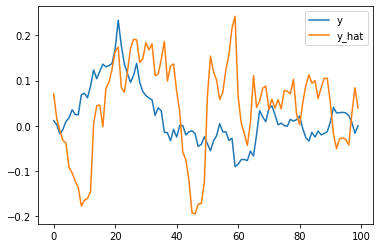

i=201, epochs=2.00, elapsed=0.05, elbo=5008907124.67 loss=0.15
i=202, epochs=2.01, elapsed=0.05, elbo=4975910899.31 loss=0.14
i=203, epochs=2.02, elapsed=0.05, elbo=4990399243.10 loss=0.15
i=204, epochs=2.03, elapsed=0.05, elbo=5167131911.82 loss=0.14
i=205, epochs=2.04, elapsed=0.05, elbo=5060120967.79 loss=0.14


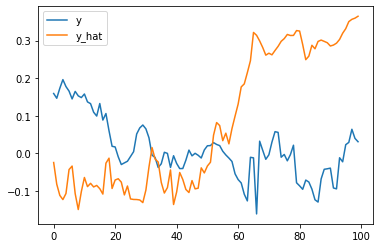

i=206, epochs=2.05, elapsed=0.05, elbo=4967888512.95 loss=0.14
i=207, epochs=2.06, elapsed=0.05, elbo=4981129696.47 loss=0.15
i=208, epochs=2.07, elapsed=0.05, elbo=4994977405.45 loss=0.14
i=209, epochs=2.08, elapsed=0.05, elbo=5017332103.67 loss=0.14
i=210, epochs=2.09, elapsed=0.05, elbo=4969177868.26 loss=0.14


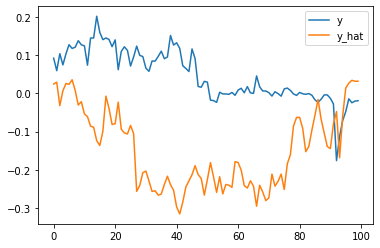

i=211, epochs=2.10, elapsed=0.05, elbo=5039561723.36 loss=0.14
i=212, epochs=2.11, elapsed=0.05, elbo=4893167900.62 loss=0.14
i=213, epochs=2.12, elapsed=0.05, elbo=4896640128.77 loss=0.14
i=214, epochs=2.13, elapsed=0.05, elbo=4786648120.41 loss=0.14
i=215, epochs=2.14, elapsed=0.05, elbo=4823954835.63 loss=0.14


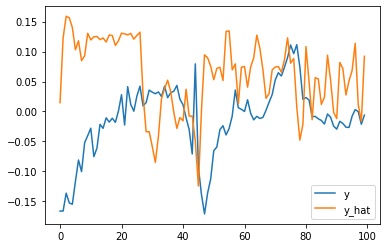

i=216, epochs=2.15, elapsed=0.05, elbo=4814886855.15 loss=0.14
i=217, epochs=2.16, elapsed=0.05, elbo=4818459534.79 loss=0.14
i=218, epochs=2.17, elapsed=0.05, elbo=4804334263.94 loss=0.14
i=219, epochs=2.18, elapsed=0.05, elbo=4765335336.10 loss=0.14
i=220, epochs=2.19, elapsed=0.05, elbo=4840970394.41 loss=0.14


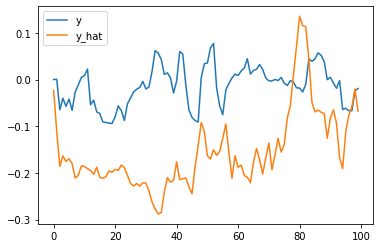

i=221, epochs=2.20, elapsed=0.05, elbo=4727905712.88 loss=0.14
i=222, epochs=2.21, elapsed=0.05, elbo=4653320327.35 loss=0.14
i=223, epochs=2.22, elapsed=0.05, elbo=4716342475.73 loss=0.14
i=224, epochs=2.23, elapsed=0.05, elbo=4733141729.81 loss=0.14
i=225, epochs=2.24, elapsed=0.05, elbo=4763145495.14 loss=0.14


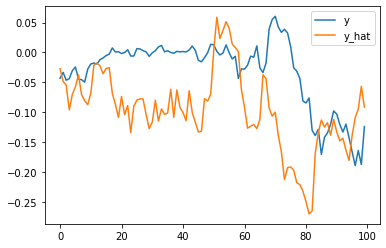

i=226, epochs=2.25, elapsed=0.05, elbo=4752232177.35 loss=0.14
i=227, epochs=2.26, elapsed=0.05, elbo=4676893613.94 loss=0.14
i=228, epochs=2.27, elapsed=0.05, elbo=4646854934.15 loss=0.14
i=229, epochs=2.28, elapsed=0.05, elbo=4764692947.88 loss=0.14
i=230, epochs=2.29, elapsed=0.05, elbo=4671066492.13 loss=0.14


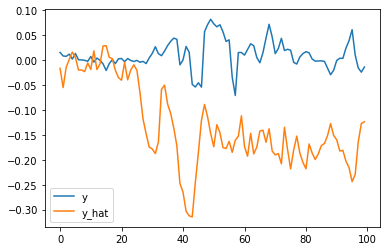

i=231, epochs=2.30, elapsed=0.05, elbo=4583022584.18 loss=0.14
i=232, epochs=2.31, elapsed=0.05, elbo=4715054018.29 loss=0.14
i=233, epochs=2.32, elapsed=0.05, elbo=4624488988.82 loss=0.14
i=234, epochs=2.33, elapsed=0.06, elbo=4580518112.03 loss=0.14
i=235, epochs=2.34, elapsed=0.06, elbo=4692467831.34 loss=0.14


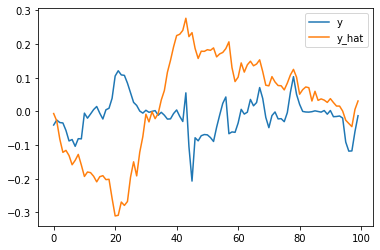

i=236, epochs=2.35, elapsed=0.06, elbo=4565481060.06 loss=0.14
i=237, epochs=2.36, elapsed=0.06, elbo=4626123267.79 loss=0.14
i=238, epochs=2.37, elapsed=0.06, elbo=4468438577.93 loss=0.14
i=239, epochs=2.38, elapsed=0.06, elbo=4588541714.78 loss=0.14
i=240, epochs=2.39, elapsed=0.06, elbo=4624511538.69 loss=0.14


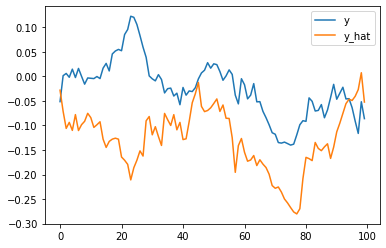

i=241, epochs=2.40, elapsed=0.06, elbo=4511641944.94 loss=0.14
i=242, epochs=2.41, elapsed=0.06, elbo=4544693298.73 loss=0.14
i=243, epochs=2.42, elapsed=0.06, elbo=4524315280.19 loss=0.14
i=244, epochs=2.43, elapsed=0.06, elbo=4485998085.93 loss=0.14
i=245, epochs=2.44, elapsed=0.06, elbo=4450785838.08 loss=0.14


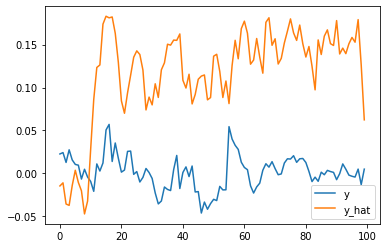

i=246, epochs=2.45, elapsed=0.06, elbo=4477605464.60 loss=0.14
i=247, epochs=2.46, elapsed=0.06, elbo=4437769660.85 loss=0.14
i=248, epochs=2.47, elapsed=0.06, elbo=4524018967.79 loss=0.14
i=249, epochs=2.48, elapsed=0.06, elbo=4412898532.02 loss=0.14
i=250, epochs=2.49, elapsed=0.06, elbo=4476058666.64 loss=0.14


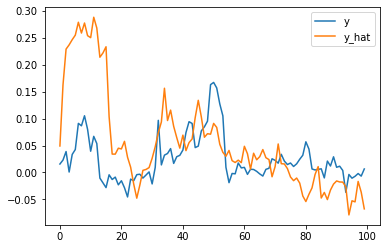

i=251, epochs=2.50, elapsed=0.06, elbo=4462871908.06 loss=0.14
i=252, epochs=2.51, elapsed=0.06, elbo=4453316210.14 loss=0.14
i=253, epochs=2.52, elapsed=0.06, elbo=4388605267.00 loss=0.14
i=254, epochs=2.53, elapsed=0.06, elbo=4445502320.92 loss=0.14
i=255, epochs=2.54, elapsed=0.06, elbo=4329783271.52 loss=0.14


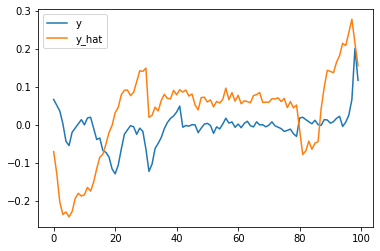

i=256, epochs=2.55, elapsed=0.06, elbo=4451349678.24 loss=0.14
i=257, epochs=2.56, elapsed=0.06, elbo=4409956747.81 loss=0.14
i=258, epochs=2.57, elapsed=0.06, elbo=4481460091.86 loss=0.14
i=259, epochs=2.58, elapsed=0.06, elbo=4425083389.73 loss=0.14
i=260, epochs=2.59, elapsed=0.06, elbo=4548192846.15 loss=0.14


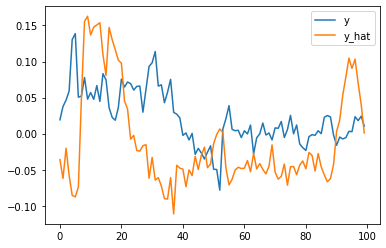

i=261, epochs=2.60, elapsed=0.06, elbo=4499975765.17 loss=0.14
i=262, epochs=2.61, elapsed=0.06, elbo=4348430840.35 loss=0.14
i=263, epochs=2.62, elapsed=0.06, elbo=4331749361.81 loss=0.14
i=264, epochs=2.63, elapsed=0.06, elbo=4460999934.70 loss=0.14
i=265, epochs=2.64, elapsed=0.06, elbo=4422033037.42 loss=0.14


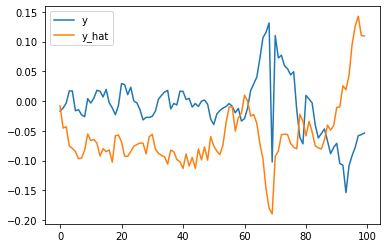

i=266, epochs=2.65, elapsed=0.06, elbo=4367851486.18 loss=0.14
i=267, epochs=2.66, elapsed=0.06, elbo=4418493792.04 loss=0.14
i=268, epochs=2.67, elapsed=0.06, elbo=4355310288.31 loss=0.14
i=269, epochs=2.68, elapsed=0.06, elbo=4419816873.61 loss=0.14
i=270, epochs=2.69, elapsed=0.06, elbo=4345317009.11 loss=0.14


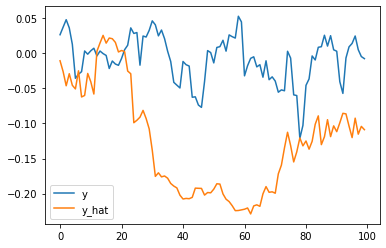

i=271, epochs=2.70, elapsed=0.06, elbo=4379689526.58 loss=0.14
i=272, epochs=2.71, elapsed=0.06, elbo=4431674837.47 loss=0.14
i=273, epochs=2.72, elapsed=0.06, elbo=4276222264.80 loss=0.14
i=274, epochs=2.73, elapsed=0.06, elbo=4414450256.87 loss=0.14
i=275, epochs=2.74, elapsed=0.06, elbo=4342970189.40 loss=0.14


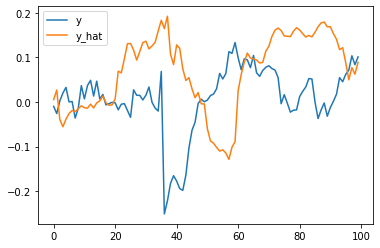

i=276, epochs=2.75, elapsed=0.07, elbo=4325676964.63 loss=0.14
i=277, epochs=2.76, elapsed=0.07, elbo=4307206612.98 loss=0.14
i=278, epochs=2.77, elapsed=0.07, elbo=4415852684.39 loss=0.14
i=279, epochs=2.78, elapsed=0.07, elbo=4305886035.04 loss=0.14
i=280, epochs=2.79, elapsed=0.07, elbo=4217967025.81 loss=0.14


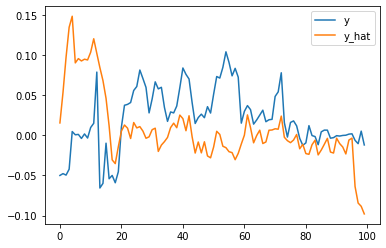

i=281, epochs=2.80, elapsed=0.07, elbo=4329436361.07 loss=0.14
i=282, epochs=2.81, elapsed=0.07, elbo=4265513961.06 loss=0.14
i=283, epochs=2.82, elapsed=0.07, elbo=4187187737.40 loss=0.13
i=284, epochs=2.83, elapsed=0.07, elbo=4259689098.52 loss=0.14
i=285, epochs=2.84, elapsed=0.07, elbo=4178413664.60 loss=0.14


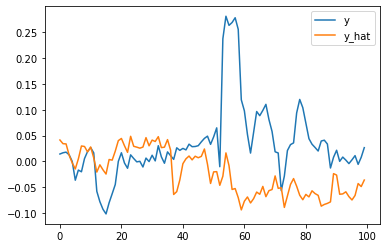

i=286, epochs=2.85, elapsed=0.07, elbo=4250424017.08 loss=0.14
i=287, epochs=2.86, elapsed=0.07, elbo=4219603666.12 loss=0.14
i=288, epochs=2.87, elapsed=0.07, elbo=4290764315.06 loss=0.14
i=289, epochs=2.88, elapsed=0.07, elbo=4218130805.69 loss=0.13
i=290, epochs=2.89, elapsed=0.07, elbo=4106517102.09 loss=0.14


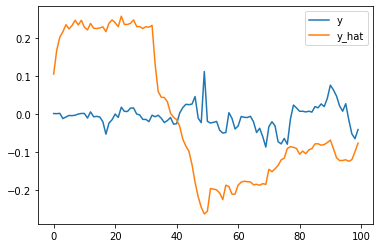

i=291, epochs=2.90, elapsed=0.07, elbo=4235398857.68 loss=0.13
i=292, epochs=2.91, elapsed=0.07, elbo=4216854668.69 loss=0.13
i=293, epochs=2.92, elapsed=0.07, elbo=4194745837.81 loss=0.13
i=294, epochs=2.93, elapsed=0.07, elbo=4241855237.68 loss=0.13
i=295, epochs=2.94, elapsed=0.07, elbo=4196174356.45 loss=0.13


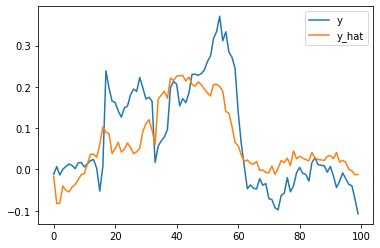

i=296, epochs=2.95, elapsed=0.07, elbo=4245793891.38 loss=0.13
i=297, epochs=2.96, elapsed=0.07, elbo=4156811071.58 loss=0.13
i=298, epochs=2.97, elapsed=0.07, elbo=4187392189.56 loss=0.13
i=299, epochs=2.98, elapsed=0.07, elbo=4282047284.57 loss=0.13
i=300, epochs=2.99, elapsed=0.07, elbo=4114171723.76 loss=0.13


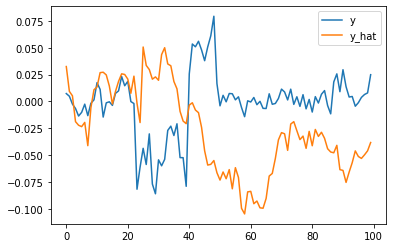

i=301, epochs=3.00, elapsed=0.07, elbo=4111049369.74 loss=0.13
i=302, epochs=3.01, elapsed=0.07, elbo=4151548068.23 loss=0.13
i=303, epochs=3.02, elapsed=0.07, elbo=4229392391.77 loss=0.14
i=304, epochs=3.03, elapsed=0.07, elbo=4021477098.46 loss=0.14
i=305, epochs=3.04, elapsed=0.07, elbo=4171313732.54 loss=0.13


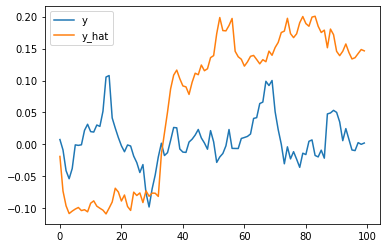

i=306, epochs=3.05, elapsed=0.07, elbo=4134542341.44 loss=0.14
i=307, epochs=3.06, elapsed=0.07, elbo=4156547800.88 loss=0.13
i=308, epochs=3.07, elapsed=0.07, elbo=4203158129.16 loss=0.13
i=309, epochs=3.08, elapsed=0.07, elbo=4249810853.92 loss=0.13
i=310, epochs=3.09, elapsed=0.07, elbo=4124417092.25 loss=0.13


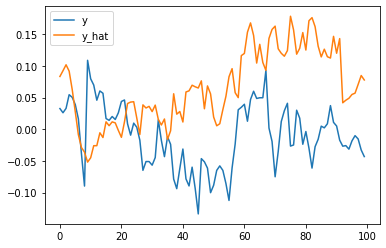

i=311, epochs=3.10, elapsed=0.07, elbo=4187020751.21 loss=0.14
i=312, epochs=3.11, elapsed=0.07, elbo=4103335768.03 loss=0.13
i=313, epochs=3.12, elapsed=0.07, elbo=4208461404.38 loss=0.13
i=314, epochs=3.13, elapsed=0.07, elbo=4187259416.80 loss=0.13
i=315, epochs=3.14, elapsed=0.07, elbo=4183210308.15 loss=0.13


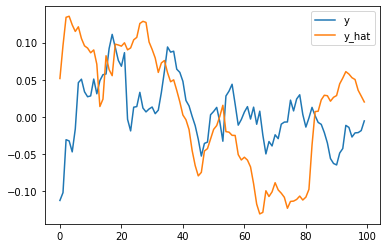

i=316, epochs=3.15, elapsed=0.07, elbo=4079243586.80 loss=0.13
i=317, epochs=3.16, elapsed=0.07, elbo=4039870598.22 loss=0.13
i=318, epochs=3.17, elapsed=0.07, elbo=4028325694.65 loss=0.13
i=319, epochs=3.18, elapsed=0.08, elbo=4040958090.67 loss=0.13
i=320, epochs=3.19, elapsed=0.08, elbo=4049496782.17 loss=0.13


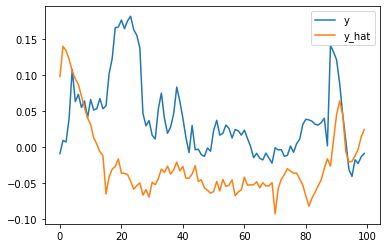

i=321, epochs=3.20, elapsed=0.08, elbo=4067711988.45 loss=0.13
i=322, epochs=3.21, elapsed=0.08, elbo=4056953004.77 loss=0.13
i=323, epochs=3.22, elapsed=0.08, elbo=4051118553.92 loss=0.13
i=324, epochs=3.23, elapsed=0.08, elbo=4024934272.22 loss=0.13
i=325, epochs=3.24, elapsed=0.08, elbo=4060289834.15 loss=0.13


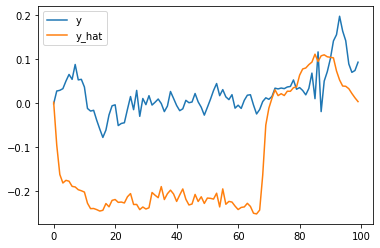

i=326, epochs=3.25, elapsed=0.08, elbo=3985387049.16 loss=0.13
i=327, epochs=3.26, elapsed=0.08, elbo=4051869240.99 loss=0.13
i=328, epochs=3.27, elapsed=0.08, elbo=3952331060.37 loss=0.13
i=329, epochs=3.28, elapsed=0.08, elbo=3952866080.82 loss=0.13
i=330, epochs=3.29, elapsed=0.08, elbo=3982348077.36 loss=0.13


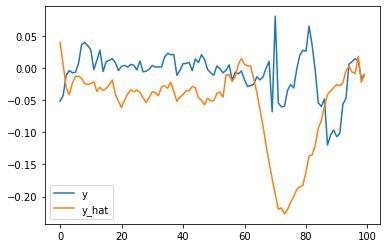

i=331, epochs=3.30, elapsed=0.08, elbo=3846142361.60 loss=0.13
i=332, epochs=3.31, elapsed=0.08, elbo=3940182825.13 loss=0.13
i=333, epochs=3.32, elapsed=0.08, elbo=3877426777.82 loss=0.13
i=334, epochs=3.33, elapsed=0.08, elbo=3905078228.63 loss=0.13
i=335, epochs=3.34, elapsed=0.08, elbo=3948609280.41 loss=0.13


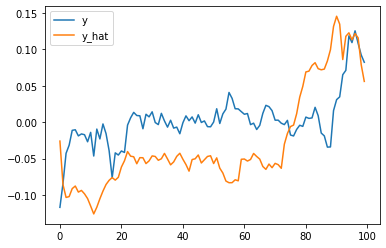

i=336, epochs=3.35, elapsed=0.08, elbo=3921109104.16 loss=0.13
i=337, epochs=3.36, elapsed=0.08, elbo=3998111231.06 loss=0.13
i=338, epochs=3.37, elapsed=0.08, elbo=3996538979.48 loss=0.13
i=339, epochs=3.38, elapsed=0.08, elbo=3963423063.58 loss=0.13
i=340, epochs=3.39, elapsed=0.08, elbo=3872476041.15 loss=0.13


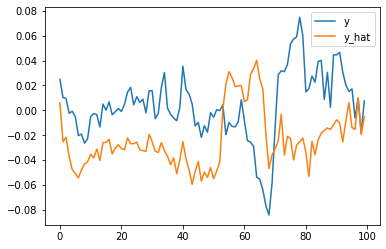

i=341, epochs=3.40, elapsed=0.08, elbo=3891084799.07 loss=0.13
i=342, epochs=3.41, elapsed=0.08, elbo=3944764019.07 loss=0.13
i=343, epochs=3.42, elapsed=0.08, elbo=3851280394.34 loss=0.13
i=344, epochs=3.43, elapsed=0.08, elbo=3852706130.30 loss=0.13
i=345, epochs=3.44, elapsed=0.08, elbo=3881647234.99 loss=0.13


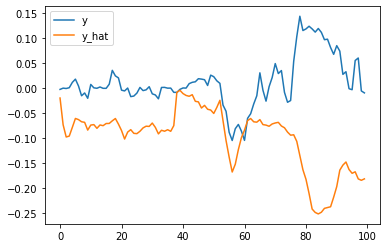

i=346, epochs=3.45, elapsed=0.08, elbo=3839345160.30 loss=0.13
i=347, epochs=3.46, elapsed=0.08, elbo=3866821700.57 loss=0.13
i=348, epochs=3.47, elapsed=0.08, elbo=3946493771.35 loss=0.13
i=349, epochs=3.48, elapsed=0.08, elbo=3853695189.10 loss=0.13
i=350, epochs=3.49, elapsed=0.08, elbo=3901476128.28 loss=0.13


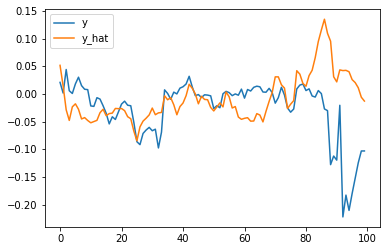

i=351, epochs=3.50, elapsed=0.08, elbo=3848840825.37 loss=0.13
i=352, epochs=3.51, elapsed=0.08, elbo=3902567202.95 loss=0.13
i=353, epochs=3.52, elapsed=0.08, elbo=3780435896.53 loss=0.13
i=354, epochs=3.53, elapsed=0.08, elbo=3854984440.98 loss=0.13
i=355, epochs=3.54, elapsed=0.08, elbo=3801471698.61 loss=0.13


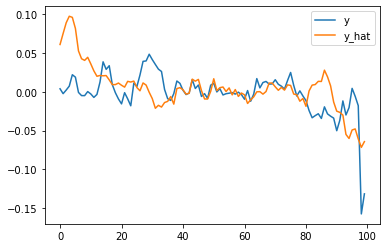

i=356, epochs=3.55, elapsed=0.08, elbo=3800326221.89 loss=0.13
i=357, epochs=3.56, elapsed=0.08, elbo=3868395869.02 loss=0.13
i=358, epochs=3.57, elapsed=0.08, elbo=3718580620.47 loss=0.13
i=359, epochs=3.57, elapsed=0.08, elbo=3655370062.86 loss=0.13
i=360, epochs=3.58, elapsed=0.08, elbo=3804669428.53 loss=0.13


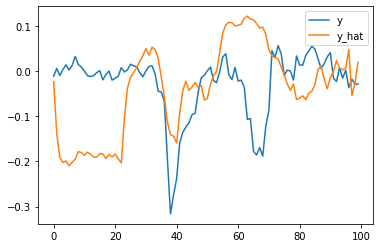

i=361, epochs=3.59, elapsed=0.09, elbo=3757076052.12 loss=0.13
i=362, epochs=3.60, elapsed=0.09, elbo=3736755678.15 loss=0.13
i=363, epochs=3.61, elapsed=0.09, elbo=3735595049.18 loss=0.13
i=364, epochs=3.62, elapsed=0.09, elbo=3966449919.82 loss=0.13
i=365, epochs=3.63, elapsed=0.09, elbo=3799497417.54 loss=0.13


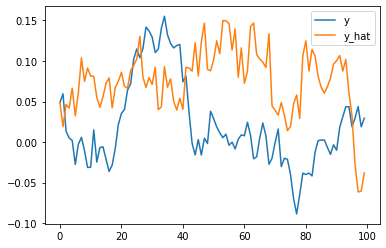

i=366, epochs=3.64, elapsed=0.09, elbo=3733969554.97 loss=0.13
i=367, epochs=3.65, elapsed=0.09, elbo=3682627556.81 loss=0.13
i=368, epochs=3.66, elapsed=0.09, elbo=3648555734.13 loss=0.13
i=369, epochs=3.67, elapsed=0.09, elbo=3717952934.07 loss=0.13
i=370, epochs=3.68, elapsed=0.09, elbo=3727836502.71 loss=0.13


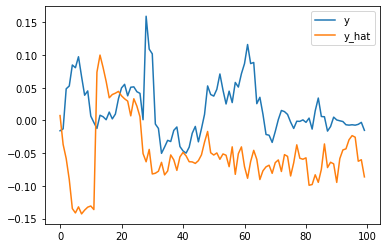

i=371, epochs=3.69, elapsed=0.09, elbo=3716960405.31 loss=0.12
i=372, epochs=3.70, elapsed=0.09, elbo=3727090307.14 loss=0.13
i=373, epochs=3.71, elapsed=0.09, elbo=3748677550.69 loss=0.13
i=374, epochs=3.72, elapsed=0.09, elbo=3706570087.30 loss=0.13
i=375, epochs=3.73, elapsed=0.09, elbo=3582756929.09 loss=0.12


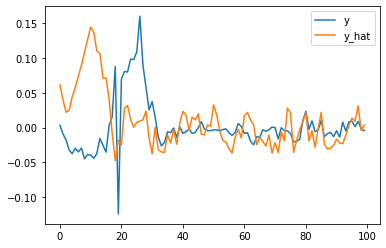

i=376, epochs=3.74, elapsed=0.09, elbo=3716772652.80 loss=0.12
i=377, epochs=3.75, elapsed=0.09, elbo=3692537946.80 loss=0.13
i=378, epochs=3.76, elapsed=0.09, elbo=3843185385.41 loss=0.13
i=379, epochs=3.77, elapsed=0.09, elbo=3727338960.82 loss=0.12
i=380, epochs=3.78, elapsed=0.09, elbo=3585832310.47 loss=0.12


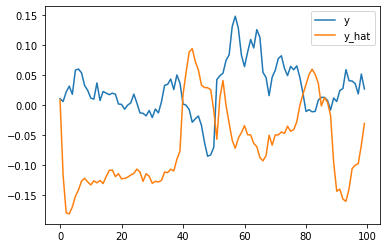

i=381, epochs=3.79, elapsed=0.09, elbo=3547578745.76 loss=0.13
i=382, epochs=3.80, elapsed=0.09, elbo=3651924840.60 loss=0.13
i=383, epochs=3.81, elapsed=0.09, elbo=3537157908.07 loss=0.12
i=384, epochs=3.82, elapsed=0.09, elbo=3682071497.29 loss=0.12
i=385, epochs=3.83, elapsed=0.09, elbo=3607270352.34 loss=0.12


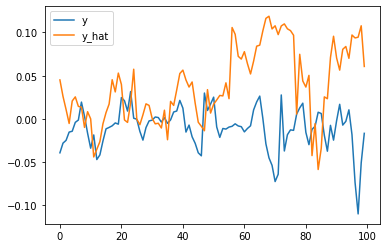

i=386, epochs=3.84, elapsed=0.09, elbo=3612113629.59 loss=0.13
i=387, epochs=3.85, elapsed=0.09, elbo=3684506017.51 loss=0.13
i=388, epochs=3.86, elapsed=0.09, elbo=3670906388.99 loss=0.13
i=389, epochs=3.87, elapsed=0.09, elbo=3671709596.98 loss=0.12
i=390, epochs=3.88, elapsed=0.09, elbo=3528903110.49 loss=0.12


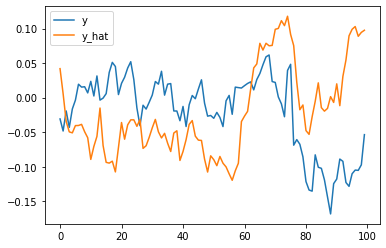

i=391, epochs=3.89, elapsed=0.09, elbo=3684798150.42 loss=0.12
i=392, epochs=3.90, elapsed=0.09, elbo=3616557148.53 loss=0.12
i=393, epochs=3.91, elapsed=0.09, elbo=3464163851.25 loss=0.12
i=394, epochs=3.92, elapsed=0.09, elbo=3513818909.25 loss=0.12
i=395, epochs=3.93, elapsed=0.09, elbo=3543620893.86 loss=0.12


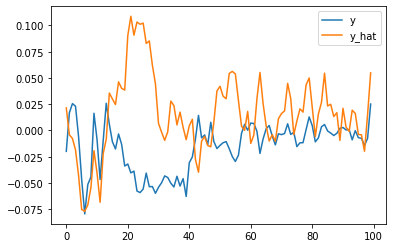

i=396, epochs=3.94, elapsed=0.09, elbo=3440808333.03 loss=0.12
i=397, epochs=3.95, elapsed=0.09, elbo=3560987145.91 loss=0.12
i=398, epochs=3.96, elapsed=0.09, elbo=3470528110.84 loss=0.12
i=399, epochs=3.97, elapsed=0.09, elbo=3480925942.95 loss=0.12
i=400, epochs=3.98, elapsed=0.09, elbo=3475880450.88 loss=0.12


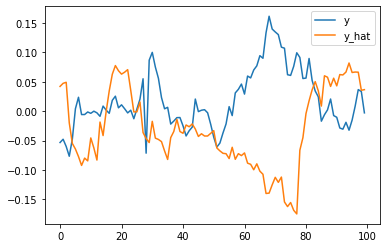

i=401, epochs=3.99, elapsed=0.09, elbo=3432673273.78 loss=0.12
i=402, epochs=4.00, elapsed=0.09, elbo=3410697536.21 loss=0.12
i=403, epochs=4.01, elapsed=0.09, elbo=3347677256.41 loss=0.12
i=404, epochs=4.02, elapsed=0.10, elbo=3390291111.21 loss=0.12
i=405, epochs=4.03, elapsed=0.10, elbo=3370477575.72 loss=0.12


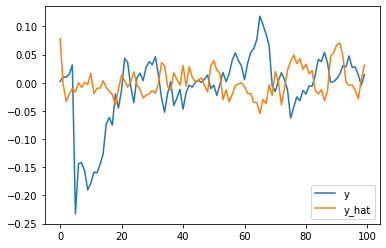

i=406, epochs=4.04, elapsed=0.10, elbo=3396825354.02 loss=0.12
i=407, epochs=4.05, elapsed=0.10, elbo=3345524718.40 loss=0.12
i=408, epochs=4.06, elapsed=0.10, elbo=3342800184.98 loss=0.12
i=409, epochs=4.07, elapsed=0.10, elbo=3305188755.30 loss=0.12
i=410, epochs=4.08, elapsed=0.10, elbo=3331614415.07 loss=0.12


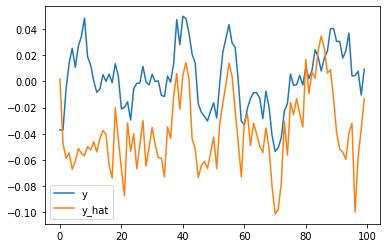

i=411, epochs=4.09, elapsed=0.10, elbo=3232394786.91 loss=0.12
i=412, epochs=4.10, elapsed=0.10, elbo=3323981313.94 loss=0.12
i=413, epochs=4.11, elapsed=0.10, elbo=3161250724.28 loss=0.12
i=414, epochs=4.12, elapsed=0.10, elbo=3252625750.05 loss=0.12
i=415, epochs=4.13, elapsed=0.10, elbo=3183708919.74 loss=0.12


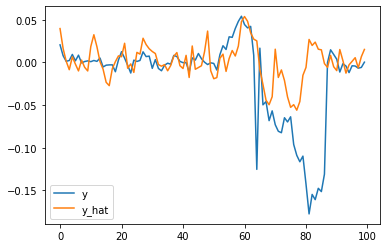

i=416, epochs=4.14, elapsed=0.10, elbo=3246905181.82 loss=0.12
i=417, epochs=4.15, elapsed=0.10, elbo=3227334336.80 loss=0.12
i=418, epochs=4.16, elapsed=0.10, elbo=3286205095.95 loss=0.12
i=419, epochs=4.17, elapsed=0.10, elbo=3228147356.03 loss=0.12
i=420, epochs=4.18, elapsed=0.10, elbo=3360568866.48 loss=0.12


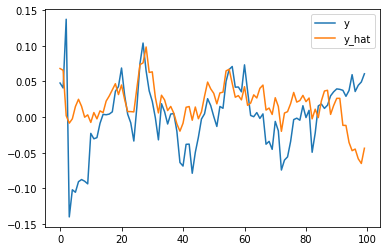

i=421, epochs=4.19, elapsed=0.10, elbo=3371168668.49 loss=0.12
i=422, epochs=4.20, elapsed=0.10, elbo=3249927071.11 loss=0.11
i=423, epochs=4.21, elapsed=0.10, elbo=3271925141.97 loss=0.12
i=424, epochs=4.22, elapsed=0.10, elbo=3229380096.80 loss=0.12
i=425, epochs=4.23, elapsed=0.10, elbo=3252072005.97 loss=0.11


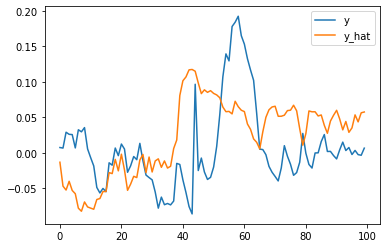

i=426, epochs=4.24, elapsed=0.10, elbo=3184386106.95 loss=0.12
i=427, epochs=4.25, elapsed=0.10, elbo=3138814650.28 loss=0.11
i=428, epochs=4.26, elapsed=0.10, elbo=3207317658.70 loss=0.12
i=429, epochs=4.27, elapsed=0.10, elbo=3214328298.29 loss=0.11
i=430, epochs=4.28, elapsed=0.10, elbo=3141317822.65 loss=0.12


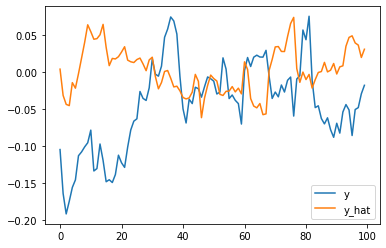

i=431, epochs=4.29, elapsed=0.10, elbo=3097982368.07 loss=0.11
i=432, epochs=4.30, elapsed=0.10, elbo=3251958435.04 loss=0.11
i=433, epochs=4.31, elapsed=0.10, elbo=3122367354.08 loss=0.11
i=434, epochs=4.32, elapsed=0.10, elbo=3020678484.27 loss=0.11
i=435, epochs=4.33, elapsed=0.10, elbo=3057982354.71 loss=0.11


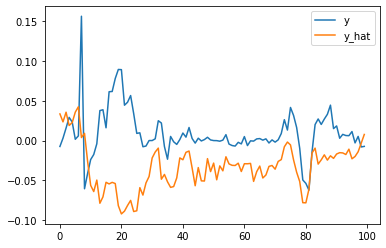

i=436, epochs=4.34, elapsed=0.10, elbo=3047319764.06 loss=0.11
i=437, epochs=4.35, elapsed=0.10, elbo=3096261842.13 loss=0.11
i=438, epochs=4.36, elapsed=0.10, elbo=2993356850.96 loss=0.11
i=439, epochs=4.37, elapsed=0.10, elbo=3072965203.13 loss=0.11
i=440, epochs=4.38, elapsed=0.10, elbo=2991518848.59 loss=0.11


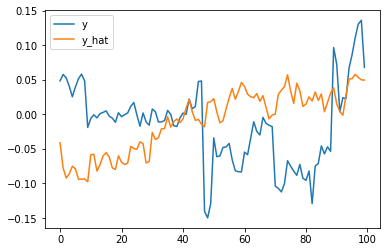

i=441, epochs=4.39, elapsed=0.10, elbo=3055291445.19 loss=0.11
i=442, epochs=4.40, elapsed=0.10, elbo=3121463095.18 loss=0.11
i=443, epochs=4.41, elapsed=0.10, elbo=2954728100.92 loss=0.11
i=444, epochs=4.42, elapsed=0.10, elbo=3016468023.14 loss=0.11
i=445, epochs=4.43, elapsed=0.10, elbo=3023375480.96 loss=0.11


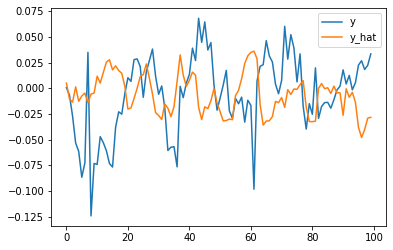

i=446, epochs=4.44, elapsed=0.10, elbo=2989006479.96 loss=0.11
i=447, epochs=4.45, elapsed=0.11, elbo=3040842284.41 loss=0.11
i=448, epochs=4.46, elapsed=0.11, elbo=3046050832.54 loss=0.11
i=449, epochs=4.47, elapsed=0.11, elbo=2894836791.76 loss=0.11
i=450, epochs=4.48, elapsed=0.11, elbo=2959074588.54 loss=0.11


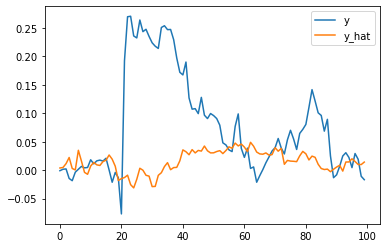

i=451, epochs=4.49, elapsed=0.11, elbo=2941487339.78 loss=0.11
i=452, epochs=4.50, elapsed=0.11, elbo=2882950080.01 loss=0.11
i=453, epochs=4.51, elapsed=0.11, elbo=2914441540.42 loss=0.11
i=454, epochs=4.52, elapsed=0.11, elbo=2872075790.65 loss=0.11
i=455, epochs=4.53, elapsed=0.11, elbo=2885994782.07 loss=0.11


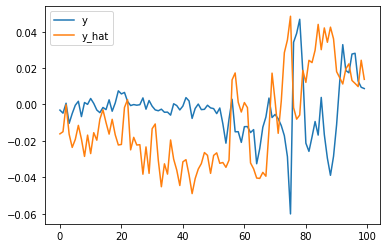

i=456, epochs=4.54, elapsed=0.11, elbo=2995555933.19 loss=0.11
i=457, epochs=4.55, elapsed=0.11, elbo=2839512729.01 loss=0.11
i=458, epochs=4.56, elapsed=0.11, elbo=2893563432.81 loss=0.11
i=459, epochs=4.57, elapsed=0.11, elbo=2866795411.85 loss=0.11
i=460, epochs=4.58, elapsed=0.11, elbo=2850094621.81 loss=0.11


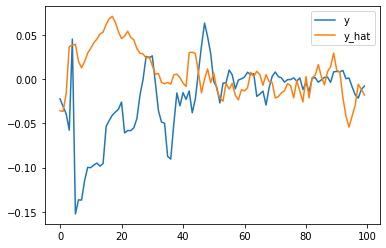

i=461, epochs=4.59, elapsed=0.11, elbo=2817211550.97 loss=0.11
i=462, epochs=4.60, elapsed=0.11, elbo=2814503475.90 loss=0.11
i=463, epochs=4.61, elapsed=0.11, elbo=2875367128.77 loss=0.11
i=464, epochs=4.62, elapsed=0.11, elbo=2910039418.80 loss=0.11
i=465, epochs=4.63, elapsed=0.11, elbo=2868013999.33 loss=0.11


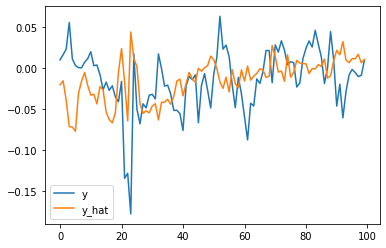

i=466, epochs=4.64, elapsed=0.11, elbo=2943500991.84 loss=0.11
i=467, epochs=4.65, elapsed=0.11, elbo=2829443589.30 loss=0.11
i=468, epochs=4.66, elapsed=0.11, elbo=2919555340.37 loss=0.11
i=469, epochs=4.67, elapsed=0.11, elbo=2857756197.52 loss=0.11
i=470, epochs=4.68, elapsed=0.11, elbo=2818117315.20 loss=0.11


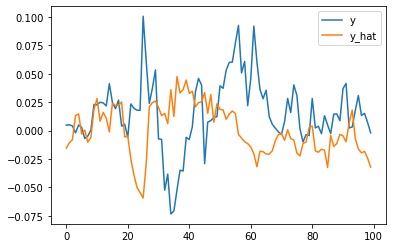

i=471, epochs=4.69, elapsed=0.11, elbo=2885744153.59 loss=0.11
i=472, epochs=4.70, elapsed=0.11, elbo=2757731970.42 loss=0.11
i=473, epochs=4.71, elapsed=0.11, elbo=2807291798.77 loss=0.11
i=474, epochs=4.72, elapsed=0.11, elbo=2843786043.55 loss=0.11
i=475, epochs=4.73, elapsed=0.11, elbo=2821173451.29 loss=0.11


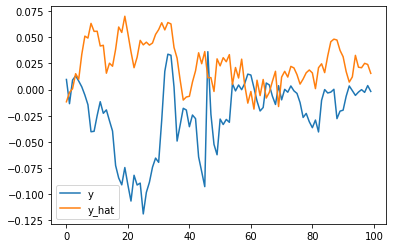

i=476, epochs=4.74, elapsed=0.11, elbo=2763562953.32 loss=0.11
i=477, epochs=4.75, elapsed=0.11, elbo=2682312592.43 loss=0.11
i=478, epochs=4.76, elapsed=0.11, elbo=2809921679.93 loss=0.11
i=479, epochs=4.77, elapsed=0.11, elbo=2860022142.40 loss=0.10
i=480, epochs=4.78, elapsed=0.11, elbo=2759056058.70 loss=0.11


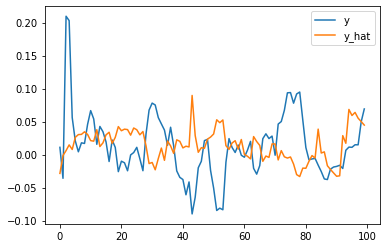

i=481, epochs=4.79, elapsed=0.11, elbo=2732230466.50 loss=0.11
i=482, epochs=4.80, elapsed=0.11, elbo=2820136046.57 loss=0.10
i=483, epochs=4.81, elapsed=0.11, elbo=2798925305.92 loss=0.10
i=484, epochs=4.82, elapsed=0.11, elbo=2662498709.79 loss=0.11
i=485, epochs=4.83, elapsed=0.11, elbo=2733196964.22 loss=0.10


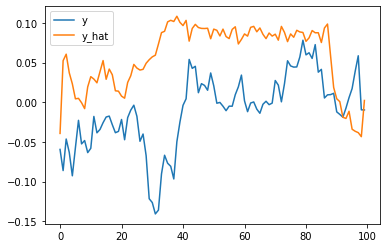

i=486, epochs=4.84, elapsed=0.11, elbo=2758949356.55 loss=0.10
i=487, epochs=4.85, elapsed=0.11, elbo=2728931941.57 loss=0.11
i=488, epochs=4.86, elapsed=0.11, elbo=2686981677.86 loss=0.10
i=489, epochs=4.87, elapsed=0.11, elbo=2599231320.53 loss=0.10
i=490, epochs=4.88, elapsed=0.12, elbo=2684536175.56 loss=0.10


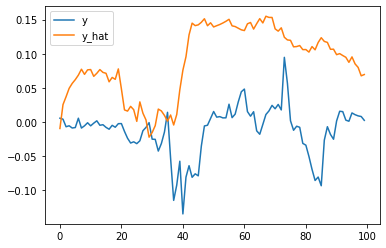

i=491, epochs=4.89, elapsed=0.12, elbo=2704495834.44 loss=0.11
i=492, epochs=4.90, elapsed=0.12, elbo=2814076219.93 loss=0.11
i=493, epochs=4.91, elapsed=0.12, elbo=2706131067.48 loss=0.11
i=494, epochs=4.92, elapsed=0.12, elbo=2846356775.78 loss=0.10
i=495, epochs=4.93, elapsed=0.12, elbo=2715264968.87 loss=0.11


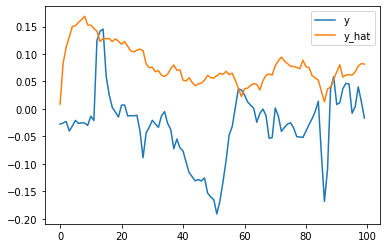

i=496, epochs=4.94, elapsed=0.12, elbo=2738324560.09 loss=0.11
i=497, epochs=4.95, elapsed=0.12, elbo=2730880161.76 loss=0.11
i=498, epochs=4.96, elapsed=0.12, elbo=2685264468.85 loss=0.10
i=499, epochs=4.97, elapsed=0.12, elbo=2683405106.46 loss=0.11
i=500, epochs=4.98, elapsed=0.12, elbo=2732302693.70 loss=0.10


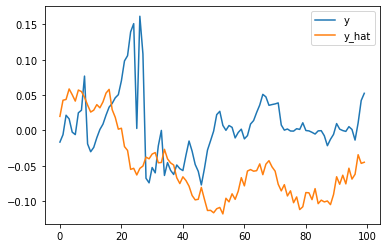

i=501, epochs=4.99, elapsed=0.12, elbo=2644407216.34 loss=0.10
i=502, epochs=5.00, elapsed=0.12, elbo=2633277713.93 loss=0.10
i=503, epochs=5.01, elapsed=0.12, elbo=2620614806.06 loss=0.10
i=504, epochs=5.02, elapsed=0.12, elbo=2688520028.05 loss=0.10
i=505, epochs=5.03, elapsed=0.12, elbo=2607037717.60 loss=0.10


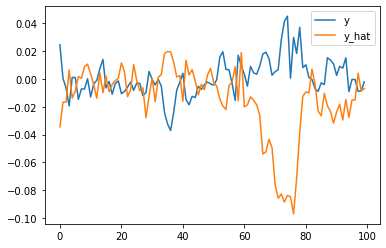

i=506, epochs=5.04, elapsed=0.12, elbo=2490829796.19 loss=0.10
i=507, epochs=5.05, elapsed=0.12, elbo=2516446867.48 loss=0.10
i=508, epochs=5.06, elapsed=0.12, elbo=2497010585.43 loss=0.10
i=509, epochs=5.07, elapsed=0.12, elbo=2518882760.23 loss=0.10
i=510, epochs=5.08, elapsed=0.12, elbo=2532828159.34 loss=0.10


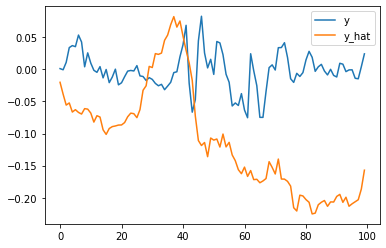

i=511, epochs=5.09, elapsed=0.12, elbo=2480570366.99 loss=0.10
i=512, epochs=5.10, elapsed=0.12, elbo=2558750680.36 loss=0.11
i=513, epochs=5.11, elapsed=0.12, elbo=2509043641.69 loss=0.10
i=514, epochs=5.12, elapsed=0.12, elbo=2583562658.44 loss=0.10
i=515, epochs=5.13, elapsed=0.12, elbo=2529454172.90 loss=0.11


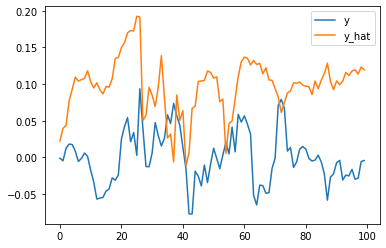

i=516, epochs=5.14, elapsed=0.12, elbo=2655381363.23 loss=0.11
i=517, epochs=5.15, elapsed=0.12, elbo=2589336809.10 loss=0.10
i=518, epochs=5.16, elapsed=0.12, elbo=2609295505.70 loss=0.10
i=519, epochs=5.17, elapsed=0.12, elbo=2503970760.21 loss=0.10
i=520, epochs=5.18, elapsed=0.12, elbo=2461547874.13 loss=0.10


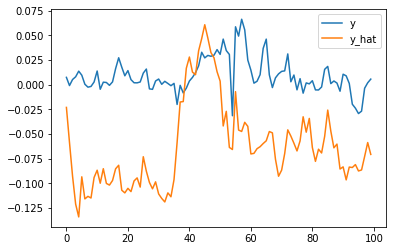

i=521, epochs=5.19, elapsed=0.12, elbo=2489885752.43 loss=0.10
i=522, epochs=5.20, elapsed=0.12, elbo=2347871604.33 loss=0.10
i=523, epochs=5.21, elapsed=0.12, elbo=2418509616.53 loss=0.10
i=524, epochs=5.22, elapsed=0.12, elbo=2520575754.16 loss=0.10
i=525, epochs=5.23, elapsed=0.12, elbo=2379263915.39 loss=0.10


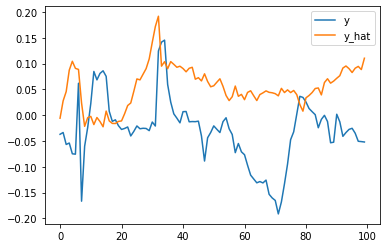

i=526, epochs=5.24, elapsed=0.12, elbo=2484406109.32 loss=0.10
i=527, epochs=5.25, elapsed=0.12, elbo=2449612747.25 loss=0.10
i=528, epochs=5.26, elapsed=0.12, elbo=2479835632.79 loss=0.10
i=529, epochs=5.27, elapsed=0.12, elbo=2393618137.77 loss=0.10
i=530, epochs=5.28, elapsed=0.12, elbo=2341736786.79 loss=0.10


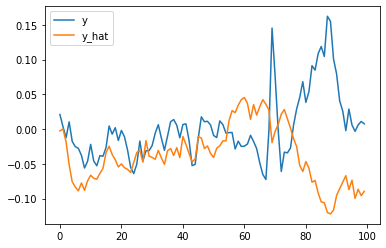

i=531, epochs=5.29, elapsed=0.12, elbo=2420642529.17 loss=0.10
i=532, epochs=5.30, elapsed=0.13, elbo=2372984037.43 loss=0.10
i=533, epochs=5.31, elapsed=0.13, elbo=2316318723.60 loss=0.10
i=534, epochs=5.32, elapsed=0.13, elbo=2289260741.90 loss=0.10
i=535, epochs=5.33, elapsed=0.13, elbo=2237789002.97 loss=0.10


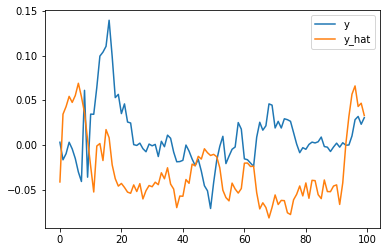

i=536, epochs=5.34, elapsed=0.13, elbo=2310647441.42 loss=0.09
i=537, epochs=5.35, elapsed=0.13, elbo=2255011794.81 loss=0.10
i=538, epochs=5.36, elapsed=0.13, elbo=2225340960.96 loss=0.10
i=539, epochs=5.37, elapsed=0.13, elbo=2191336018.07 loss=0.09
i=540, epochs=5.38, elapsed=0.13, elbo=2214975444.82 loss=0.10


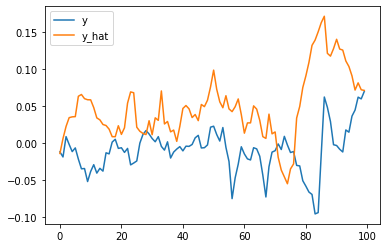

i=541, epochs=5.39, elapsed=0.13, elbo=2213552635.52 loss=0.09
i=542, epochs=5.40, elapsed=0.13, elbo=2182471330.86 loss=0.10
i=543, epochs=5.41, elapsed=0.13, elbo=2175373322.50 loss=0.09
i=544, epochs=5.42, elapsed=0.13, elbo=2131388888.48 loss=0.09
i=545, epochs=5.43, elapsed=0.13, elbo=2180681339.41 loss=0.09


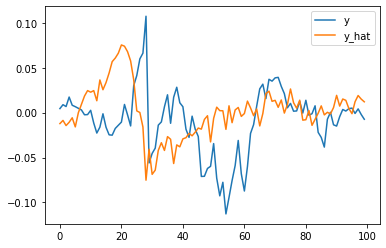

i=546, epochs=5.44, elapsed=0.13, elbo=2086477694.04 loss=0.09
i=547, epochs=5.45, elapsed=0.13, elbo=2090811920.60 loss=0.09
i=548, epochs=5.46, elapsed=0.13, elbo=2056749601.40 loss=0.09
i=549, epochs=5.47, elapsed=0.13, elbo=2031613167.40 loss=0.09
i=550, epochs=5.48, elapsed=0.13, elbo=2078868949.52 loss=0.10


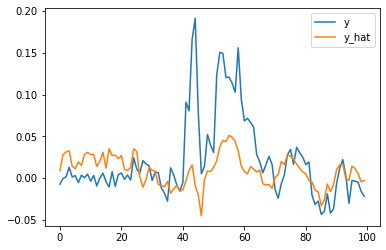

i=551, epochs=5.49, elapsed=0.13, elbo=2227659231.29 loss=0.10
i=552, epochs=5.50, elapsed=0.13, elbo=2259336769.21 loss=0.09
i=553, epochs=5.51, elapsed=0.13, elbo=2148952001.04 loss=0.09
i=554, epochs=5.52, elapsed=0.13, elbo=2119033678.10 loss=0.10
i=555, epochs=5.53, elapsed=0.13, elbo=2225292249.27 loss=0.09


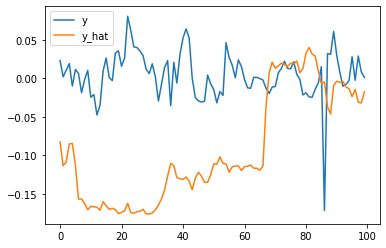

i=556, epochs=5.54, elapsed=0.13, elbo=2096438621.27 loss=0.09
i=557, epochs=5.55, elapsed=0.13, elbo=2141099332.62 loss=0.10
i=558, epochs=5.56, elapsed=0.13, elbo=2145165436.43 loss=0.09
i=559, epochs=5.57, elapsed=0.13, elbo=2089704957.47 loss=0.09
i=560, epochs=5.58, elapsed=0.13, elbo=2064537052.36 loss=0.09


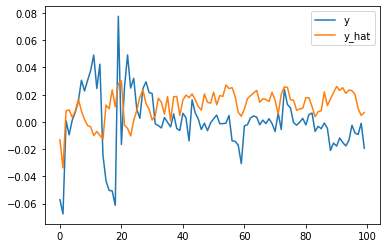

i=561, epochs=5.59, elapsed=0.13, elbo=2105816979.29 loss=0.09
i=562, epochs=5.60, elapsed=0.13, elbo=1979317238.29 loss=0.09
i=563, epochs=5.61, elapsed=0.13, elbo=2082847804.55 loss=0.09
i=564, epochs=5.62, elapsed=0.13, elbo=2075313497.44 loss=0.09
i=565, epochs=5.63, elapsed=0.13, elbo=2129242878.04 loss=0.09


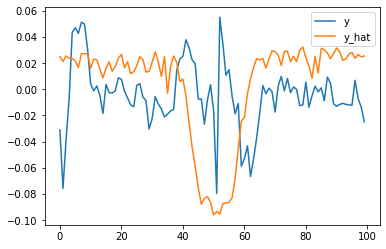

i=566, epochs=5.64, elapsed=0.13, elbo=2066682312.66 loss=0.09
i=567, epochs=5.65, elapsed=0.13, elbo=2083121285.86 loss=0.09
i=568, epochs=5.66, elapsed=0.13, elbo=2059660671.83 loss=0.09
i=569, epochs=5.67, elapsed=0.13, elbo=1984081881.73 loss=0.09
i=570, epochs=5.68, elapsed=0.13, elbo=2045702700.42 loss=0.09


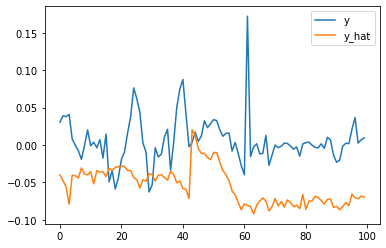

i=571, epochs=5.69, elapsed=0.13, elbo=2098383224.11 loss=0.09
i=572, epochs=5.70, elapsed=0.13, elbo=2017471653.94 loss=0.09
i=573, epochs=5.71, elapsed=0.13, elbo=2034463912.21 loss=0.09
i=574, epochs=5.72, elapsed=0.14, elbo=2095020004.74 loss=0.09
i=575, epochs=5.73, elapsed=0.14, elbo=1991308611.78 loss=0.09


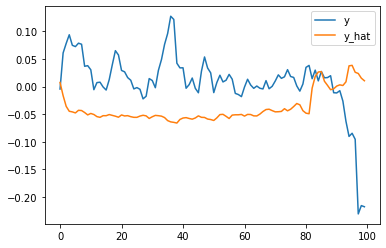

i=576, epochs=5.74, elapsed=0.14, elbo=2051573329.15 loss=0.09
i=577, epochs=5.75, elapsed=0.14, elbo=2135879867.52 loss=0.09
i=578, epochs=5.76, elapsed=0.14, elbo=1983719357.00 loss=0.09
i=579, epochs=5.77, elapsed=0.14, elbo=1943789812.26 loss=0.09
i=580, epochs=5.78, elapsed=0.14, elbo=2039605498.47 loss=0.09


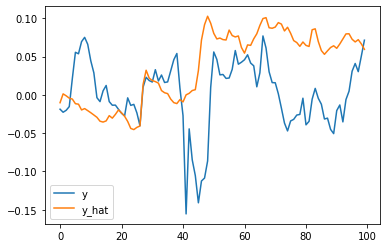

i=581, epochs=5.79, elapsed=0.14, elbo=1952544565.65 loss=0.09
i=582, epochs=5.80, elapsed=0.14, elbo=1996276240.76 loss=0.09
i=583, epochs=5.81, elapsed=0.14, elbo=1945450481.40 loss=0.09
i=584, epochs=5.82, elapsed=0.14, elbo=1976900297.33 loss=0.09
i=585, epochs=5.83, elapsed=0.14, elbo=1976909619.82 loss=0.09


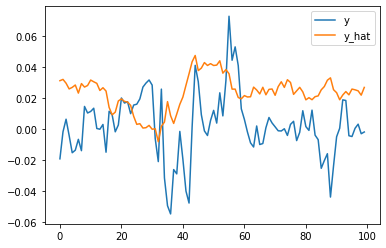

i=586, epochs=5.84, elapsed=0.14, elbo=1980153441.57 loss=0.09
i=587, epochs=5.85, elapsed=0.14, elbo=2048484332.18 loss=0.09
i=588, epochs=5.86, elapsed=0.14, elbo=1982878735.42 loss=0.09
i=589, epochs=5.87, elapsed=0.14, elbo=1924717356.87 loss=0.09
i=590, epochs=5.88, elapsed=0.14, elbo=1944722113.32 loss=0.09


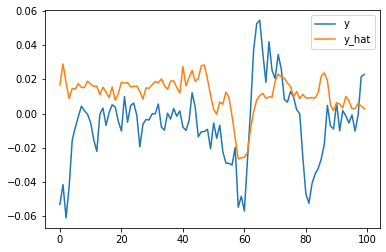

i=591, epochs=5.89, elapsed=0.14, elbo=2018342383.90 loss=0.09
i=592, epochs=5.90, elapsed=0.14, elbo=1969109748.63 loss=0.09
i=593, epochs=5.91, elapsed=0.14, elbo=1903872578.44 loss=0.09
i=594, epochs=5.92, elapsed=0.14, elbo=1994632356.27 loss=0.09
i=595, epochs=5.93, elapsed=0.14, elbo=1926684987.32 loss=0.09


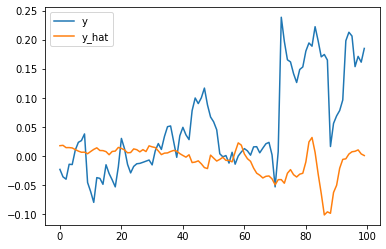

i=596, epochs=5.94, elapsed=0.14, elbo=1958587752.84 loss=0.09
i=597, epochs=5.94, elapsed=0.14, elbo=1947072025.80 loss=0.09
i=598, epochs=5.95, elapsed=0.14, elbo=1895845226.52 loss=0.09
i=599, epochs=5.96, elapsed=0.14, elbo=1924841104.25 loss=0.09
i=600, epochs=5.97, elapsed=0.14, elbo=1998073668.24 loss=0.09


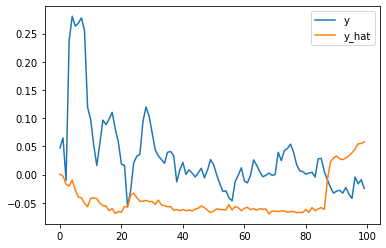

i=601, epochs=5.98, elapsed=0.14, elbo=1845779621.04 loss=0.09
i=602, epochs=5.99, elapsed=0.14, elbo=1941287531.22 loss=0.09
i=603, epochs=6.00, elapsed=0.14, elbo=1933270389.45 loss=0.09
i=604, epochs=6.01, elapsed=0.14, elbo=1958947979.59 loss=0.09
i=605, epochs=6.02, elapsed=0.14, elbo=1906276961.07 loss=0.09


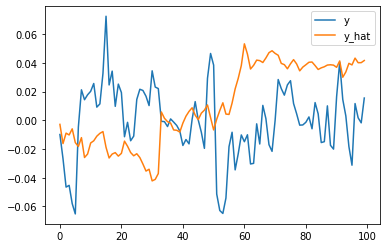

i=606, epochs=6.03, elapsed=0.14, elbo=1871608453.46 loss=0.09
i=607, epochs=6.04, elapsed=0.14, elbo=1944390808.05 loss=0.09
i=608, epochs=6.05, elapsed=0.14, elbo=1936524980.06 loss=0.09
i=609, epochs=6.06, elapsed=0.14, elbo=1911755026.68 loss=0.09
i=610, epochs=6.07, elapsed=0.14, elbo=1860878808.04 loss=0.08


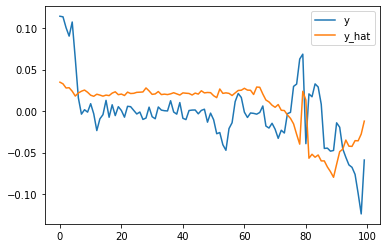

i=611, epochs=6.08, elapsed=0.14, elbo=1852946260.73 loss=0.09
i=612, epochs=6.09, elapsed=0.14, elbo=1846506253.44 loss=0.09
i=613, epochs=6.10, elapsed=0.14, elbo=1942423698.69 loss=0.09
i=614, epochs=6.11, elapsed=0.14, elbo=1902255796.12 loss=0.09
i=615, epochs=6.12, elapsed=0.14, elbo=1895692157.54 loss=0.09


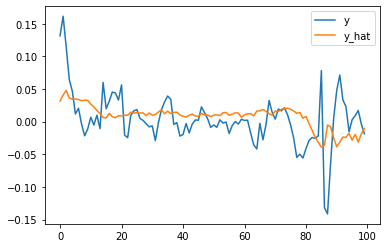

i=616, epochs=6.13, elapsed=0.14, elbo=1878233526.96 loss=0.09
i=617, epochs=6.14, elapsed=0.15, elbo=1849519595.96 loss=0.09
i=618, epochs=6.15, elapsed=0.15, elbo=1893659048.48 loss=0.08
i=619, epochs=6.16, elapsed=0.15, elbo=1881289332.16 loss=0.09
i=620, epochs=6.17, elapsed=0.15, elbo=1882489282.11 loss=0.09


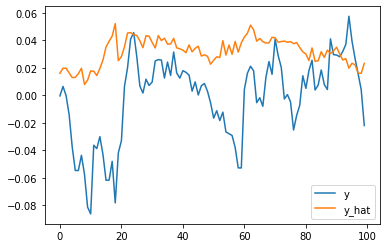

i=621, epochs=6.18, elapsed=0.15, elbo=1847298100.88 loss=0.09
i=622, epochs=6.19, elapsed=0.15, elbo=1845986587.81 loss=0.08
i=623, epochs=6.20, elapsed=0.15, elbo=1901586663.39 loss=0.08
i=624, epochs=6.21, elapsed=0.15, elbo=1872337682.38 loss=0.09
i=625, epochs=6.22, elapsed=0.15, elbo=1942597357.64 loss=0.08


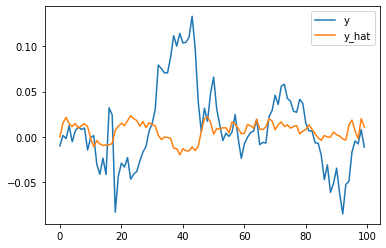

i=626, epochs=6.23, elapsed=0.15, elbo=1879476412.70 loss=0.09
i=627, epochs=6.24, elapsed=0.15, elbo=1855804729.30 loss=0.08
i=628, epochs=6.25, elapsed=0.15, elbo=1838072356.01 loss=0.08
i=629, epochs=6.26, elapsed=0.15, elbo=1854013745.68 loss=0.09
i=630, epochs=6.27, elapsed=0.15, elbo=1885831778.54 loss=nan


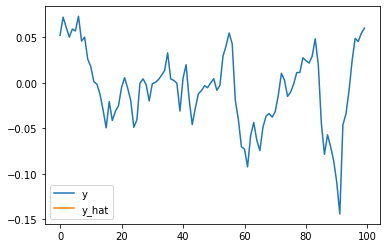

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=631, epochs=6.28, elapsed=0.15, elbo=nan loss=nan
i=632, epochs=6.29, elapsed=0.15, elbo=nan loss=nan
i=633, epochs=6.30, elapsed=0.15, elbo=nan loss=nan
i=634, epochs=6.31, elapsed=0.15, elbo=nan loss=nan
i=635, epochs=6.32, elapsed=0.15, elbo=nan loss=nan


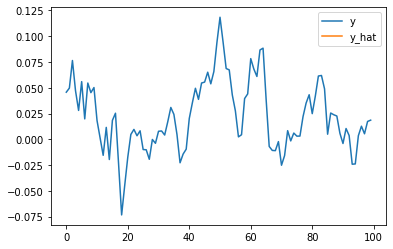

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=636, epochs=6.33, elapsed=0.15, elbo=nan loss=nan
i=637, epochs=6.34, elapsed=0.15, elbo=nan loss=nan
i=638, epochs=6.35, elapsed=0.15, elbo=nan loss=nan
i=639, epochs=6.36, elapsed=0.15, elbo=nan loss=nan
i=640, epochs=6.37, elapsed=0.15, elbo=nan loss=nan


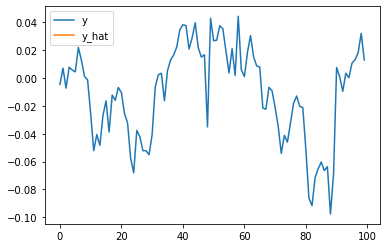

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=641, epochs=6.38, elapsed=0.15, elbo=nan loss=nan
i=642, epochs=6.39, elapsed=0.15, elbo=nan loss=nan
i=643, epochs=6.40, elapsed=0.15, elbo=nan loss=nan
i=644, epochs=6.41, elapsed=0.15, elbo=nan loss=nan
i=645, epochs=6.42, elapsed=0.15, elbo=nan loss=nan


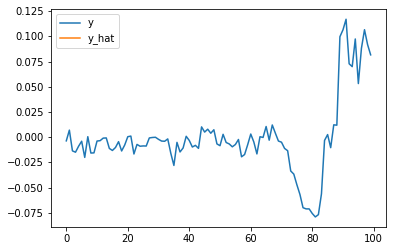

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=646, epochs=6.43, elapsed=0.15, elbo=nan loss=nan
i=647, epochs=6.44, elapsed=0.15, elbo=nan loss=nan
i=648, epochs=6.45, elapsed=0.15, elbo=nan loss=nan
i=649, epochs=6.46, elapsed=0.15, elbo=nan loss=nan
i=650, epochs=6.47, elapsed=0.15, elbo=nan loss=nan


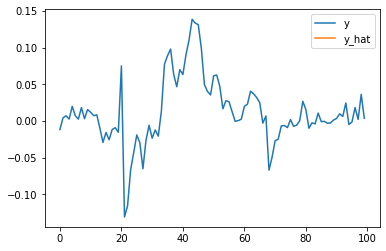

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=651, epochs=6.48, elapsed=0.15, elbo=nan loss=nan
i=652, epochs=6.49, elapsed=0.15, elbo=nan loss=nan
i=653, epochs=6.50, elapsed=0.15, elbo=nan loss=nan
i=654, epochs=6.51, elapsed=0.15, elbo=nan loss=nan
i=655, epochs=6.52, elapsed=0.15, elbo=nan loss=nan


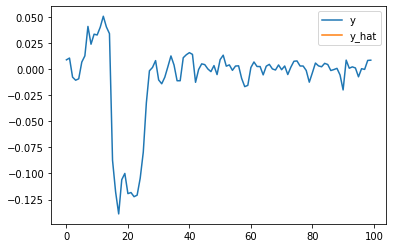

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=656, epochs=6.53, elapsed=0.15, elbo=nan loss=nan
i=657, epochs=6.54, elapsed=0.15, elbo=nan loss=nan
i=658, epochs=6.55, elapsed=0.15, elbo=nan loss=nan
i=659, epochs=6.56, elapsed=0.16, elbo=nan loss=nan
i=660, epochs=6.57, elapsed=0.16, elbo=nan loss=nan


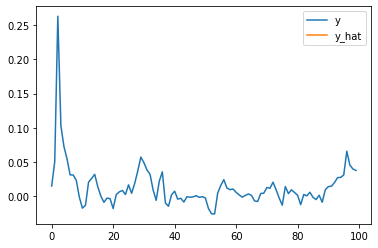

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=661, epochs=6.58, elapsed=0.16, elbo=nan loss=nan
i=662, epochs=6.59, elapsed=0.16, elbo=nan loss=nan
i=663, epochs=6.60, elapsed=0.16, elbo=nan loss=nan
i=664, epochs=6.61, elapsed=0.16, elbo=nan loss=nan
i=665, epochs=6.62, elapsed=0.16, elbo=nan loss=nan


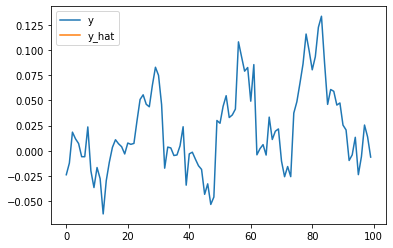

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=666, epochs=6.63, elapsed=0.16, elbo=nan loss=nan
i=667, epochs=6.64, elapsed=0.16, elbo=nan loss=nan
i=668, epochs=6.65, elapsed=0.16, elbo=nan loss=nan
i=669, epochs=6.66, elapsed=0.16, elbo=nan loss=nan
i=670, epochs=6.67, elapsed=0.16, elbo=nan loss=nan


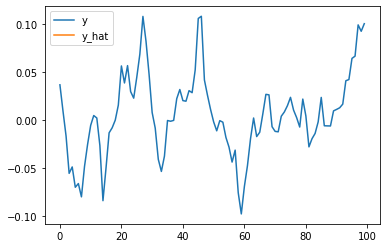

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=671, epochs=6.68, elapsed=0.16, elbo=nan loss=nan
i=672, epochs=6.69, elapsed=0.16, elbo=nan loss=nan
i=673, epochs=6.70, elapsed=0.16, elbo=nan loss=nan
i=674, epochs=6.71, elapsed=0.16, elbo=nan loss=nan
i=675, epochs=6.72, elapsed=0.16, elbo=nan loss=nan


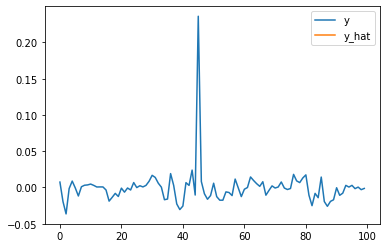

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=676, epochs=6.73, elapsed=0.16, elbo=nan loss=nan
i=677, epochs=6.74, elapsed=0.16, elbo=nan loss=nan
i=678, epochs=6.75, elapsed=0.16, elbo=nan loss=nan
i=679, epochs=6.76, elapsed=0.16, elbo=nan loss=nan
i=680, epochs=6.77, elapsed=0.16, elbo=nan loss=nan


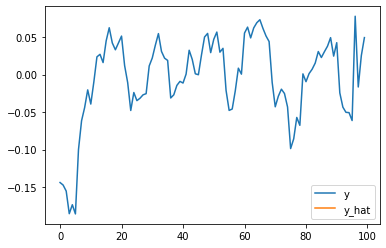

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=681, epochs=6.78, elapsed=0.16, elbo=nan loss=nan
i=682, epochs=6.79, elapsed=0.16, elbo=nan loss=nan
i=683, epochs=6.80, elapsed=0.16, elbo=nan loss=nan
i=684, epochs=6.81, elapsed=0.16, elbo=nan loss=nan
i=685, epochs=6.82, elapsed=0.16, elbo=nan loss=nan


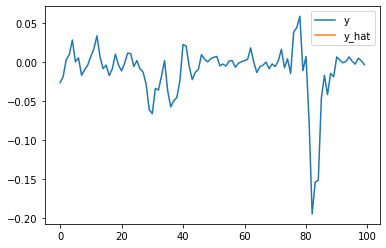

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=686, epochs=6.83, elapsed=0.16, elbo=nan loss=nan
i=687, epochs=6.84, elapsed=0.16, elbo=nan loss=nan
i=688, epochs=6.85, elapsed=0.16, elbo=nan loss=nan
i=689, epochs=6.86, elapsed=0.16, elbo=nan loss=nan
i=690, epochs=6.87, elapsed=0.16, elbo=nan loss=nan


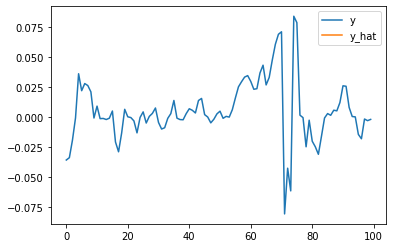

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=691, epochs=6.88, elapsed=0.16, elbo=nan loss=nan
i=692, epochs=6.89, elapsed=0.16, elbo=nan loss=nan
i=693, epochs=6.90, elapsed=0.16, elbo=nan loss=nan
i=694, epochs=6.91, elapsed=0.16, elbo=nan loss=nan
i=695, epochs=6.92, elapsed=0.16, elbo=nan loss=nan


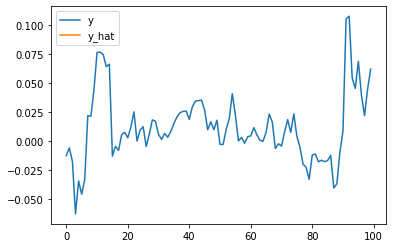

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=696, epochs=6.93, elapsed=0.16, elbo=nan loss=nan
i=697, epochs=6.94, elapsed=0.16, elbo=nan loss=nan
i=698, epochs=6.95, elapsed=0.16, elbo=nan loss=nan
i=699, epochs=6.96, elapsed=0.16, elbo=nan loss=nan
i=700, epochs=6.97, elapsed=0.16, elbo=nan loss=nan


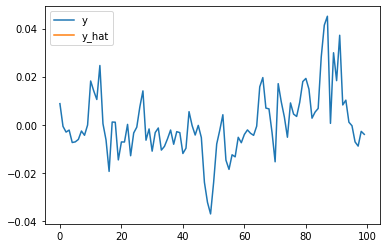

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=701, epochs=6.98, elapsed=0.17, elbo=nan loss=nan
i=702, epochs=6.99, elapsed=0.17, elbo=nan loss=nan
i=703, epochs=7.00, elapsed=0.17, elbo=nan loss=nan
i=704, epochs=7.01, elapsed=0.17, elbo=nan loss=nan
i=705, epochs=7.02, elapsed=0.17, elbo=nan loss=nan


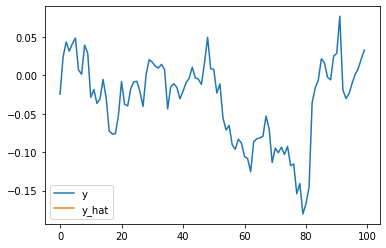

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=706, epochs=7.03, elapsed=0.17, elbo=nan loss=nan
i=707, epochs=7.04, elapsed=0.17, elbo=nan loss=nan
i=708, epochs=7.05, elapsed=0.17, elbo=nan loss=nan
i=709, epochs=7.06, elapsed=0.17, elbo=nan loss=nan
i=710, epochs=7.07, elapsed=0.17, elbo=nan loss=nan


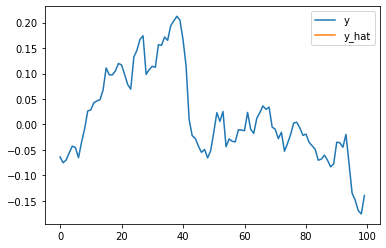

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=711, epochs=7.08, elapsed=0.17, elbo=nan loss=nan
i=712, epochs=7.09, elapsed=0.17, elbo=nan loss=nan
i=713, epochs=7.10, elapsed=0.17, elbo=nan loss=nan
i=714, epochs=7.11, elapsed=0.17, elbo=nan loss=nan
i=715, epochs=7.12, elapsed=0.17, elbo=nan loss=nan


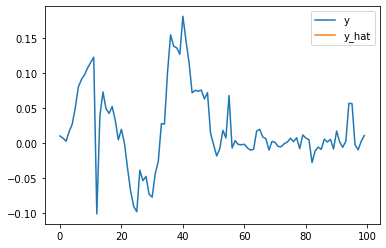

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=716, epochs=7.13, elapsed=0.17, elbo=nan loss=nan
i=717, epochs=7.14, elapsed=0.17, elbo=nan loss=nan
i=718, epochs=7.15, elapsed=0.17, elbo=nan loss=nan
i=719, epochs=7.16, elapsed=0.17, elbo=nan loss=nan
i=720, epochs=7.17, elapsed=0.17, elbo=nan loss=nan


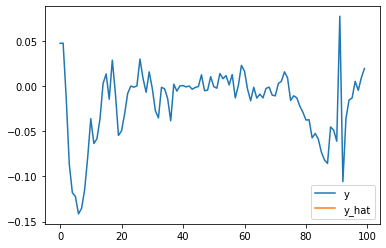

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=721, epochs=7.18, elapsed=0.17, elbo=nan loss=nan
i=722, epochs=7.19, elapsed=0.17, elbo=nan loss=nan
i=723, epochs=7.20, elapsed=0.17, elbo=nan loss=nan
i=724, epochs=7.21, elapsed=0.17, elbo=nan loss=nan
i=725, epochs=7.22, elapsed=0.17, elbo=nan loss=nan


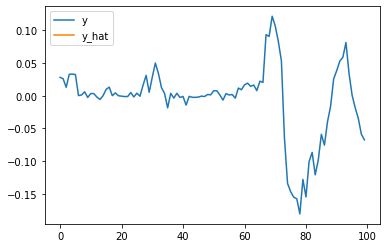

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=726, epochs=7.23, elapsed=0.17, elbo=nan loss=nan
i=727, epochs=7.24, elapsed=0.17, elbo=nan loss=nan
i=728, epochs=7.25, elapsed=0.17, elbo=nan loss=nan
i=729, epochs=7.26, elapsed=0.17, elbo=nan loss=nan
i=730, epochs=7.27, elapsed=0.17, elbo=nan loss=nan


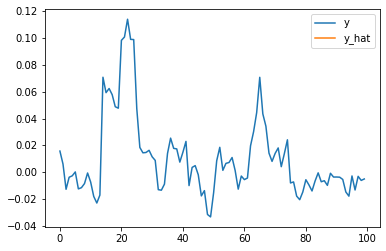

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=731, epochs=7.28, elapsed=0.17, elbo=nan loss=nan
i=732, epochs=7.29, elapsed=0.17, elbo=nan loss=nan
i=733, epochs=7.30, elapsed=0.17, elbo=nan loss=nan
i=734, epochs=7.31, elapsed=0.17, elbo=nan loss=nan
i=735, epochs=7.32, elapsed=0.17, elbo=nan loss=nan


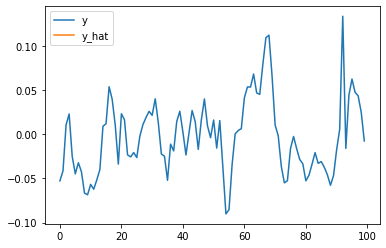

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=736, epochs=7.33, elapsed=0.17, elbo=nan loss=nan
i=737, epochs=7.34, elapsed=0.17, elbo=nan loss=nan
i=738, epochs=7.35, elapsed=0.17, elbo=nan loss=nan
i=739, epochs=7.36, elapsed=0.17, elbo=nan loss=nan
i=740, epochs=7.37, elapsed=0.17, elbo=nan loss=nan


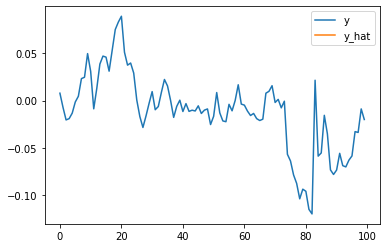

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=741, epochs=7.38, elapsed=0.17, elbo=nan loss=nan
i=742, epochs=7.39, elapsed=0.18, elbo=nan loss=nan
i=743, epochs=7.40, elapsed=0.18, elbo=nan loss=nan
i=744, epochs=7.41, elapsed=0.18, elbo=nan loss=nan
i=745, epochs=7.42, elapsed=0.18, elbo=nan loss=nan


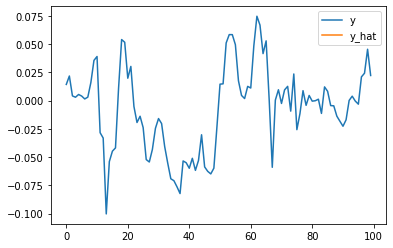

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=746, epochs=7.43, elapsed=0.18, elbo=nan loss=nan
i=747, epochs=7.44, elapsed=0.18, elbo=nan loss=nan
i=748, epochs=7.45, elapsed=0.18, elbo=nan loss=nan
i=749, epochs=7.46, elapsed=0.18, elbo=nan loss=nan
i=750, epochs=7.47, elapsed=0.18, elbo=nan loss=nan


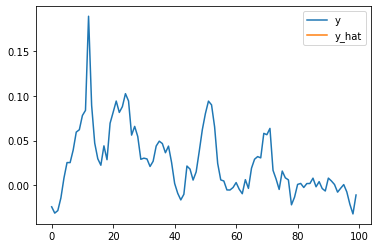

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=751, epochs=7.48, elapsed=0.18, elbo=nan loss=nan
i=752, epochs=7.49, elapsed=0.18, elbo=nan loss=nan
i=753, epochs=7.50, elapsed=0.18, elbo=nan loss=nan
i=754, epochs=7.51, elapsed=0.18, elbo=nan loss=nan
i=755, epochs=7.52, elapsed=0.18, elbo=nan loss=nan


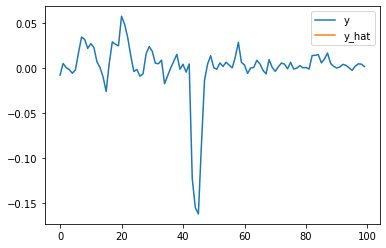

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=756, epochs=7.53, elapsed=0.18, elbo=nan loss=nan
i=757, epochs=7.54, elapsed=0.18, elbo=nan loss=nan
i=758, epochs=7.55, elapsed=0.18, elbo=nan loss=nan
i=759, epochs=7.56, elapsed=0.18, elbo=nan loss=nan
i=760, epochs=7.57, elapsed=0.18, elbo=nan loss=nan


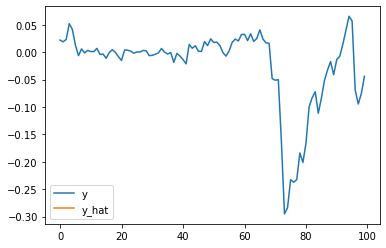

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=761, epochs=7.58, elapsed=0.18, elbo=nan loss=nan
i=762, epochs=7.59, elapsed=0.18, elbo=nan loss=nan
i=763, epochs=7.60, elapsed=0.18, elbo=nan loss=nan
i=764, epochs=7.61, elapsed=0.18, elbo=nan loss=nan
i=765, epochs=7.62, elapsed=0.18, elbo=nan loss=nan


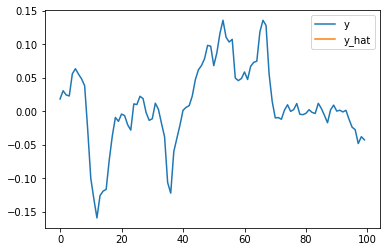

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=766, epochs=7.63, elapsed=0.18, elbo=nan loss=nan
i=767, epochs=7.64, elapsed=0.18, elbo=nan loss=nan
i=768, epochs=7.65, elapsed=0.18, elbo=nan loss=nan
i=769, epochs=7.66, elapsed=0.18, elbo=nan loss=nan
i=770, epochs=7.67, elapsed=0.18, elbo=nan loss=nan


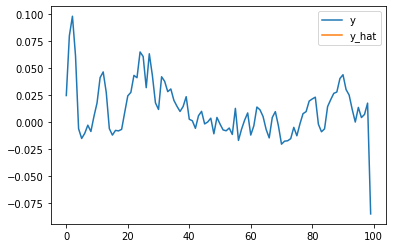

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=771, epochs=7.68, elapsed=0.18, elbo=nan loss=nan
i=772, epochs=7.69, elapsed=0.18, elbo=nan loss=nan
i=773, epochs=7.70, elapsed=0.18, elbo=nan loss=nan
i=774, epochs=7.71, elapsed=0.18, elbo=nan loss=nan
i=775, epochs=7.72, elapsed=0.18, elbo=nan loss=nan


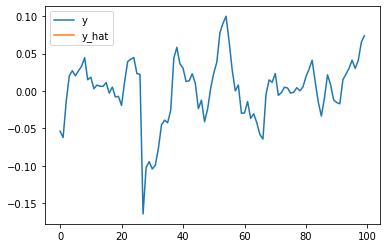

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=776, epochs=7.73, elapsed=0.18, elbo=nan loss=nan
i=777, epochs=7.74, elapsed=0.18, elbo=nan loss=nan
i=778, epochs=7.75, elapsed=0.18, elbo=nan loss=nan
i=779, epochs=7.76, elapsed=0.18, elbo=nan loss=nan
i=780, epochs=7.77, elapsed=0.18, elbo=nan loss=nan


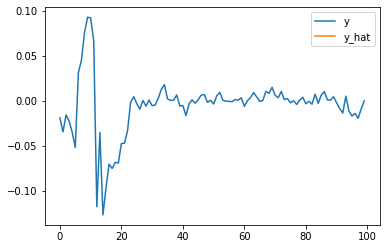

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=781, epochs=7.78, elapsed=0.18, elbo=nan loss=nan
i=782, epochs=7.79, elapsed=0.18, elbo=nan loss=nan
i=783, epochs=7.80, elapsed=0.18, elbo=nan loss=nan
i=784, epochs=7.81, elapsed=0.19, elbo=nan loss=nan
i=785, epochs=7.82, elapsed=0.19, elbo=nan loss=nan


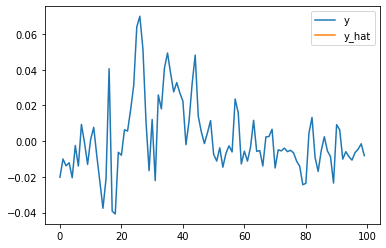

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=786, epochs=7.83, elapsed=0.19, elbo=nan loss=nan
i=787, epochs=7.84, elapsed=0.19, elbo=nan loss=nan
i=788, epochs=7.85, elapsed=0.19, elbo=nan loss=nan
i=789, epochs=7.86, elapsed=0.19, elbo=nan loss=nan
i=790, epochs=7.87, elapsed=0.19, elbo=nan loss=nan


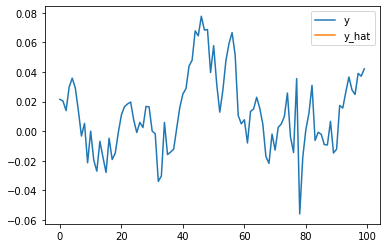

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=791, epochs=7.88, elapsed=0.19, elbo=nan loss=nan
i=792, epochs=7.89, elapsed=0.19, elbo=nan loss=nan
i=793, epochs=7.90, elapsed=0.19, elbo=nan loss=nan
i=794, epochs=7.91, elapsed=0.19, elbo=nan loss=nan
i=795, epochs=7.92, elapsed=0.19, elbo=nan loss=nan


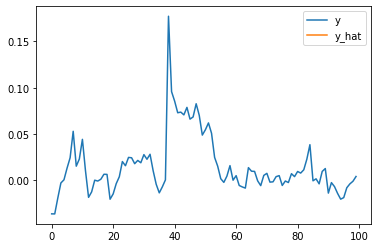

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=796, epochs=7.93, elapsed=0.19, elbo=nan loss=nan
i=797, epochs=7.94, elapsed=0.19, elbo=nan loss=nan
i=798, epochs=7.95, elapsed=0.19, elbo=nan loss=nan
i=799, epochs=7.96, elapsed=0.19, elbo=nan loss=nan
i=800, epochs=7.97, elapsed=0.19, elbo=nan loss=nan


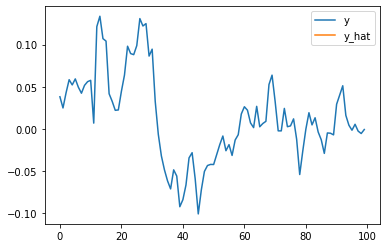

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=801, epochs=7.98, elapsed=0.19, elbo=nan loss=nan
i=802, epochs=7.99, elapsed=0.19, elbo=nan loss=nan
i=803, epochs=8.00, elapsed=0.19, elbo=nan loss=nan
i=804, epochs=8.01, elapsed=0.19, elbo=nan loss=nan
i=805, epochs=8.02, elapsed=0.19, elbo=nan loss=nan


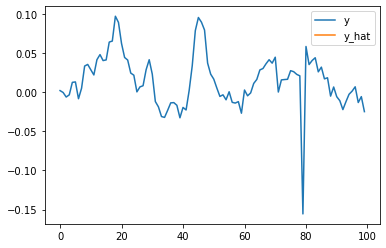

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=806, epochs=8.03, elapsed=0.19, elbo=nan loss=nan
i=807, epochs=8.04, elapsed=0.19, elbo=nan loss=nan
i=808, epochs=8.05, elapsed=0.19, elbo=nan loss=nan
i=809, epochs=8.06, elapsed=0.19, elbo=nan loss=nan
i=810, epochs=8.07, elapsed=0.19, elbo=nan loss=nan


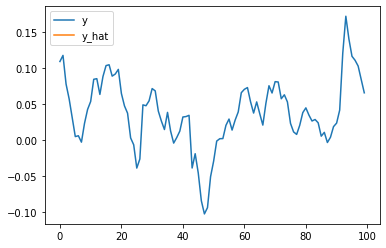

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=811, epochs=8.08, elapsed=0.19, elbo=nan loss=nan
i=812, epochs=8.09, elapsed=0.19, elbo=nan loss=nan
i=813, epochs=8.10, elapsed=0.19, elbo=nan loss=nan
i=814, epochs=8.11, elapsed=0.19, elbo=nan loss=nan
i=815, epochs=8.12, elapsed=0.19, elbo=nan loss=nan


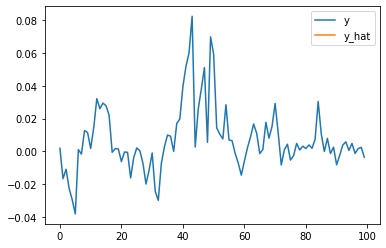

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=816, epochs=8.13, elapsed=0.19, elbo=nan loss=nan
i=817, epochs=8.14, elapsed=0.19, elbo=nan loss=nan
i=818, epochs=8.15, elapsed=0.19, elbo=nan loss=nan
i=819, epochs=8.16, elapsed=0.19, elbo=nan loss=nan
i=820, epochs=8.17, elapsed=0.19, elbo=nan loss=nan


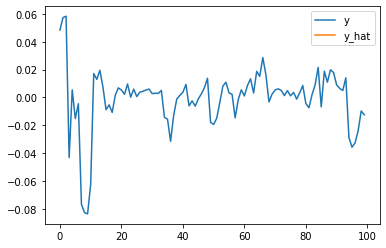

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=821, epochs=8.18, elapsed=0.19, elbo=nan loss=nan
i=822, epochs=8.19, elapsed=0.19, elbo=nan loss=nan
i=823, epochs=8.20, elapsed=0.19, elbo=nan loss=nan
i=824, epochs=8.21, elapsed=0.19, elbo=nan loss=nan
i=825, epochs=8.22, elapsed=0.19, elbo=nan loss=nan


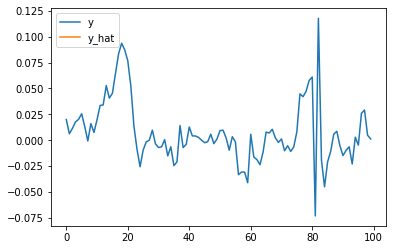

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=826, epochs=8.23, elapsed=0.20, elbo=nan loss=nan
i=827, epochs=8.24, elapsed=0.20, elbo=nan loss=nan
i=828, epochs=8.25, elapsed=0.20, elbo=nan loss=nan
i=829, epochs=8.26, elapsed=0.20, elbo=nan loss=nan
i=830, epochs=8.27, elapsed=0.20, elbo=nan loss=nan


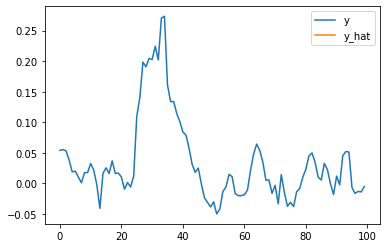

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=831, epochs=8.28, elapsed=0.20, elbo=nan loss=nan
i=832, epochs=8.29, elapsed=0.20, elbo=nan loss=nan
i=833, epochs=8.30, elapsed=0.20, elbo=nan loss=nan
i=834, epochs=8.31, elapsed=0.20, elbo=nan loss=nan
i=835, epochs=8.32, elapsed=0.20, elbo=nan loss=nan


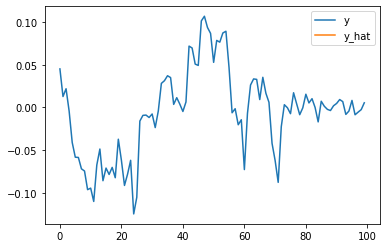

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=836, epochs=8.32, elapsed=0.20, elbo=nan loss=nan
i=837, epochs=8.33, elapsed=0.20, elbo=nan loss=nan
i=838, epochs=8.34, elapsed=0.20, elbo=nan loss=nan
i=839, epochs=8.35, elapsed=0.20, elbo=nan loss=nan
i=840, epochs=8.36, elapsed=0.20, elbo=nan loss=nan


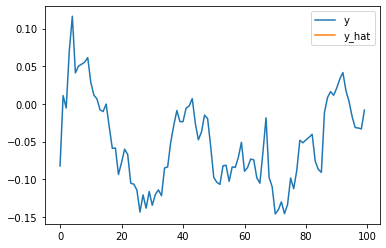

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=841, epochs=8.37, elapsed=0.20, elbo=nan loss=nan
i=842, epochs=8.38, elapsed=0.20, elbo=nan loss=nan
i=843, epochs=8.39, elapsed=0.20, elbo=nan loss=nan
i=844, epochs=8.40, elapsed=0.20, elbo=nan loss=nan
i=845, epochs=8.41, elapsed=0.20, elbo=nan loss=nan


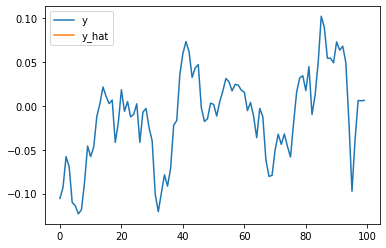

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=846, epochs=8.42, elapsed=0.20, elbo=nan loss=nan
i=847, epochs=8.43, elapsed=0.20, elbo=nan loss=nan
i=848, epochs=8.44, elapsed=0.20, elbo=nan loss=nan
i=849, epochs=8.45, elapsed=0.20, elbo=nan loss=nan
i=850, epochs=8.46, elapsed=0.20, elbo=nan loss=nan


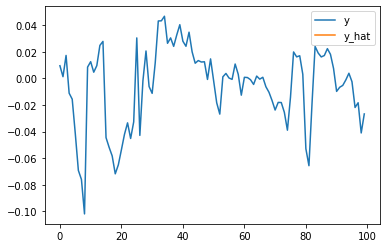

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=851, epochs=8.47, elapsed=0.20, elbo=nan loss=nan
i=852, epochs=8.48, elapsed=0.20, elbo=nan loss=nan
i=853, epochs=8.49, elapsed=0.20, elbo=nan loss=nan
i=854, epochs=8.50, elapsed=0.20, elbo=nan loss=nan
i=855, epochs=8.51, elapsed=0.20, elbo=nan loss=nan


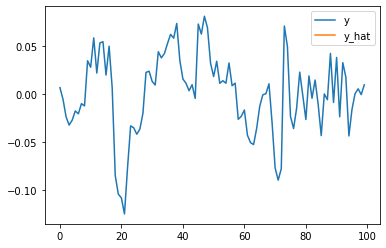

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=856, epochs=8.52, elapsed=0.20, elbo=nan loss=nan
i=857, epochs=8.53, elapsed=0.20, elbo=nan loss=nan
i=858, epochs=8.54, elapsed=0.20, elbo=nan loss=nan
i=859, epochs=8.55, elapsed=0.20, elbo=nan loss=nan
i=860, epochs=8.56, elapsed=0.20, elbo=nan loss=nan


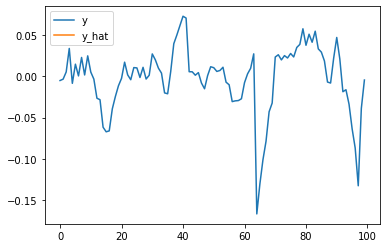

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=861, epochs=8.57, elapsed=0.20, elbo=nan loss=nan
i=862, epochs=8.58, elapsed=0.20, elbo=nan loss=nan
i=863, epochs=8.59, elapsed=0.20, elbo=nan loss=nan
i=864, epochs=8.60, elapsed=0.20, elbo=nan loss=nan
i=865, epochs=8.61, elapsed=0.20, elbo=nan loss=nan


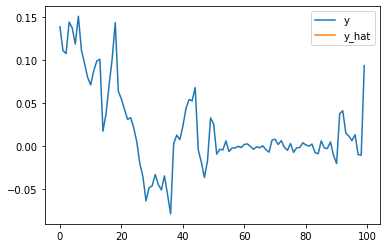

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=866, epochs=8.62, elapsed=0.20, elbo=nan loss=nan
i=867, epochs=8.63, elapsed=0.20, elbo=nan loss=nan
i=868, epochs=8.64, elapsed=0.21, elbo=nan loss=nan
i=869, epochs=8.65, elapsed=0.21, elbo=nan loss=nan
i=870, epochs=8.66, elapsed=0.21, elbo=nan loss=nan


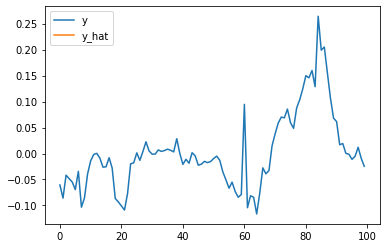

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=871, epochs=8.67, elapsed=0.21, elbo=nan loss=nan
i=872, epochs=8.68, elapsed=0.21, elbo=nan loss=nan
i=873, epochs=8.69, elapsed=0.21, elbo=nan loss=nan
i=874, epochs=8.70, elapsed=0.21, elbo=nan loss=nan
i=875, epochs=8.71, elapsed=0.21, elbo=nan loss=nan


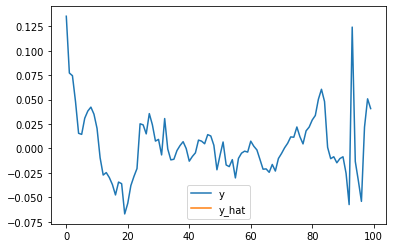

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=876, epochs=8.72, elapsed=0.21, elbo=nan loss=nan
i=877, epochs=8.73, elapsed=0.21, elbo=nan loss=nan
i=878, epochs=8.74, elapsed=0.21, elbo=nan loss=nan
i=879, epochs=8.75, elapsed=0.21, elbo=nan loss=nan
i=880, epochs=8.76, elapsed=0.21, elbo=nan loss=nan


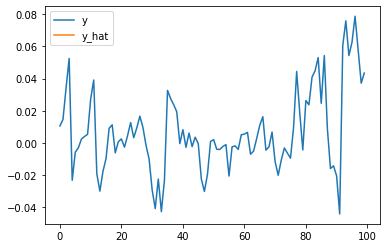

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=881, epochs=8.77, elapsed=0.21, elbo=nan loss=nan
i=882, epochs=8.78, elapsed=0.21, elbo=nan loss=nan
i=883, epochs=8.79, elapsed=0.21, elbo=nan loss=nan
i=884, epochs=8.80, elapsed=0.21, elbo=nan loss=nan
i=885, epochs=8.81, elapsed=0.21, elbo=nan loss=nan


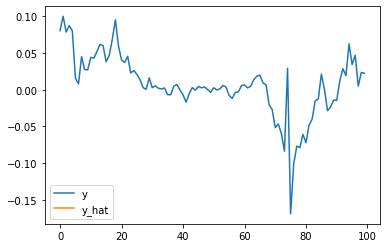

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=886, epochs=8.82, elapsed=0.21, elbo=nan loss=nan
i=887, epochs=8.83, elapsed=0.21, elbo=nan loss=nan
i=888, epochs=8.84, elapsed=0.21, elbo=nan loss=nan
i=889, epochs=8.85, elapsed=0.21, elbo=nan loss=nan
i=890, epochs=8.86, elapsed=0.21, elbo=nan loss=nan


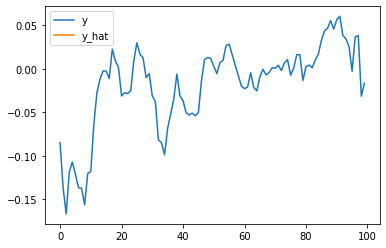

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=891, epochs=8.87, elapsed=0.21, elbo=nan loss=nan
i=892, epochs=8.88, elapsed=0.21, elbo=nan loss=nan
i=893, epochs=8.89, elapsed=0.21, elbo=nan loss=nan
i=894, epochs=8.90, elapsed=0.21, elbo=nan loss=nan
i=895, epochs=8.91, elapsed=0.21, elbo=nan loss=nan


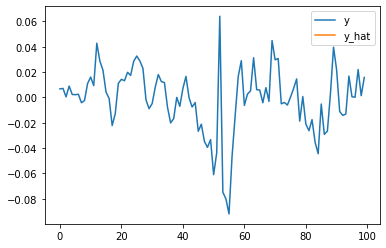

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=896, epochs=8.92, elapsed=0.21, elbo=nan loss=nan
i=897, epochs=8.93, elapsed=0.21, elbo=nan loss=nan
i=898, epochs=8.94, elapsed=0.21, elbo=nan loss=nan
i=899, epochs=8.95, elapsed=0.21, elbo=nan loss=nan
i=900, epochs=8.96, elapsed=0.21, elbo=nan loss=nan


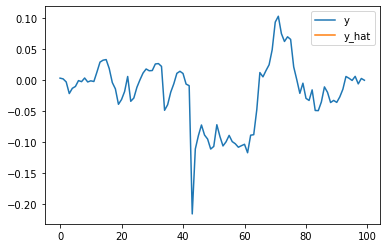

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=901, epochs=8.97, elapsed=0.21, elbo=nan loss=nan
i=902, epochs=8.98, elapsed=0.21, elbo=nan loss=nan
i=903, epochs=8.99, elapsed=0.21, elbo=nan loss=nan
i=904, epochs=9.00, elapsed=0.21, elbo=nan loss=nan
i=905, epochs=9.01, elapsed=0.21, elbo=nan loss=nan


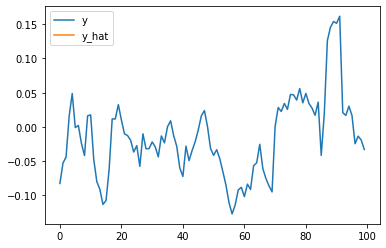

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=906, epochs=9.02, elapsed=0.21, elbo=nan loss=nan
i=907, epochs=9.03, elapsed=0.21, elbo=nan loss=nan
i=908, epochs=9.04, elapsed=0.21, elbo=nan loss=nan
i=909, epochs=9.05, elapsed=0.21, elbo=nan loss=nan
i=910, epochs=9.06, elapsed=0.22, elbo=nan loss=nan


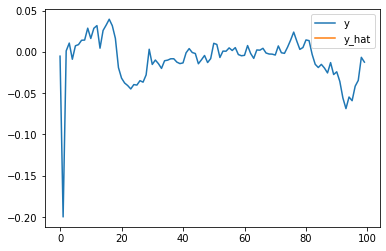

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=911, epochs=9.07, elapsed=0.22, elbo=nan loss=nan
i=912, epochs=9.08, elapsed=0.22, elbo=nan loss=nan
i=913, epochs=9.09, elapsed=0.22, elbo=nan loss=nan
i=914, epochs=9.10, elapsed=0.22, elbo=nan loss=nan
i=915, epochs=9.11, elapsed=0.22, elbo=nan loss=nan


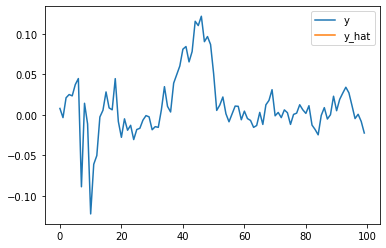

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=916, epochs=9.12, elapsed=0.22, elbo=nan loss=nan
i=917, epochs=9.13, elapsed=0.22, elbo=nan loss=nan
i=918, epochs=9.14, elapsed=0.22, elbo=nan loss=nan
i=919, epochs=9.15, elapsed=0.22, elbo=nan loss=nan
i=920, epochs=9.16, elapsed=0.22, elbo=nan loss=nan


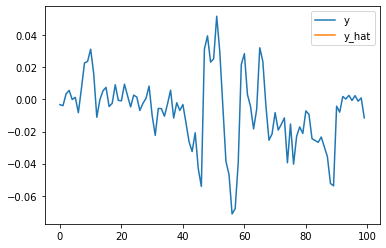

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=921, epochs=9.17, elapsed=0.22, elbo=nan loss=nan
i=922, epochs=9.18, elapsed=0.22, elbo=nan loss=nan
i=923, epochs=9.19, elapsed=0.22, elbo=nan loss=nan
i=924, epochs=9.20, elapsed=0.22, elbo=nan loss=nan
i=925, epochs=9.21, elapsed=0.22, elbo=nan loss=nan


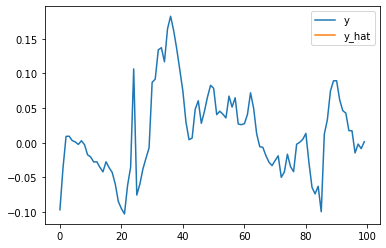

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=926, epochs=9.22, elapsed=0.22, elbo=nan loss=nan
i=927, epochs=9.23, elapsed=0.22, elbo=nan loss=nan
i=928, epochs=9.24, elapsed=0.22, elbo=nan loss=nan
i=929, epochs=9.25, elapsed=0.22, elbo=nan loss=nan
i=930, epochs=9.26, elapsed=0.22, elbo=nan loss=nan


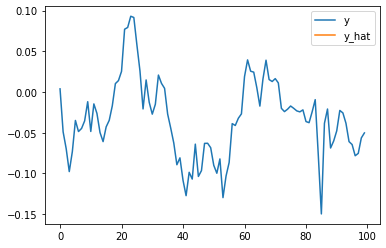

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=931, epochs=9.27, elapsed=0.22, elbo=nan loss=nan
i=932, epochs=9.28, elapsed=0.22, elbo=nan loss=nan
i=933, epochs=9.29, elapsed=0.22, elbo=nan loss=nan
i=934, epochs=9.30, elapsed=0.22, elbo=nan loss=nan
i=935, epochs=9.31, elapsed=0.22, elbo=nan loss=nan


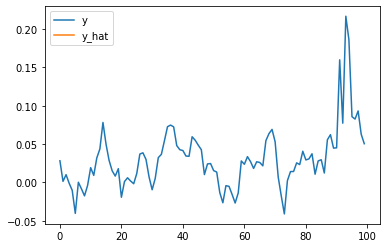

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=936, epochs=9.32, elapsed=0.22, elbo=nan loss=nan
i=937, epochs=9.33, elapsed=0.22, elbo=nan loss=nan
i=938, epochs=9.34, elapsed=0.22, elbo=nan loss=nan
i=939, epochs=9.35, elapsed=0.22, elbo=nan loss=nan
i=940, epochs=9.36, elapsed=0.22, elbo=nan loss=nan


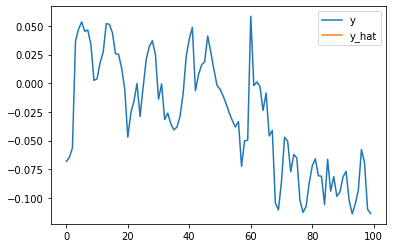

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=941, epochs=9.37, elapsed=0.22, elbo=nan loss=nan
i=942, epochs=9.38, elapsed=0.22, elbo=nan loss=nan
i=943, epochs=9.39, elapsed=0.22, elbo=nan loss=nan
i=944, epochs=9.40, elapsed=0.22, elbo=nan loss=nan
i=945, epochs=9.41, elapsed=0.22, elbo=nan loss=nan


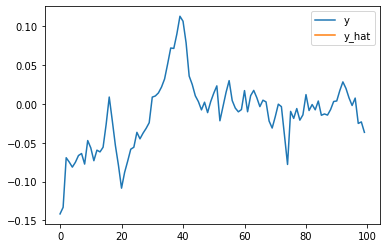

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=946, epochs=9.42, elapsed=0.22, elbo=nan loss=nan
i=947, epochs=9.43, elapsed=0.22, elbo=nan loss=nan
i=948, epochs=9.44, elapsed=0.22, elbo=nan loss=nan
i=949, epochs=9.45, elapsed=0.22, elbo=nan loss=nan
i=950, epochs=9.46, elapsed=0.22, elbo=nan loss=nan


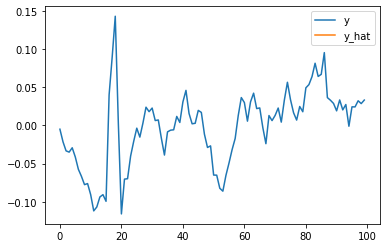

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=951, epochs=9.47, elapsed=0.23, elbo=nan loss=nan
i=952, epochs=9.48, elapsed=0.23, elbo=nan loss=nan
i=953, epochs=9.49, elapsed=0.23, elbo=nan loss=nan
i=954, epochs=9.50, elapsed=0.23, elbo=nan loss=nan
i=955, epochs=9.51, elapsed=0.23, elbo=nan loss=nan


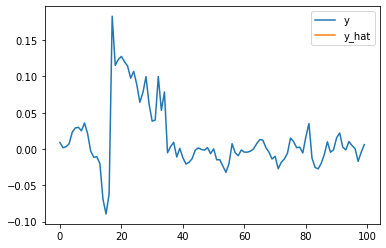

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=956, epochs=9.52, elapsed=0.23, elbo=nan loss=nan
i=957, epochs=9.53, elapsed=0.23, elbo=nan loss=nan
i=958, epochs=9.54, elapsed=0.23, elbo=nan loss=nan
i=959, epochs=9.55, elapsed=0.23, elbo=nan loss=nan
i=960, epochs=9.56, elapsed=0.23, elbo=nan loss=nan


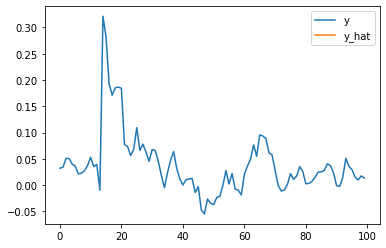

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=961, epochs=9.57, elapsed=0.23, elbo=nan loss=nan
i=962, epochs=9.58, elapsed=0.23, elbo=nan loss=nan
i=963, epochs=9.59, elapsed=0.23, elbo=nan loss=nan
i=964, epochs=9.60, elapsed=0.23, elbo=nan loss=nan
i=965, epochs=9.61, elapsed=0.23, elbo=nan loss=nan


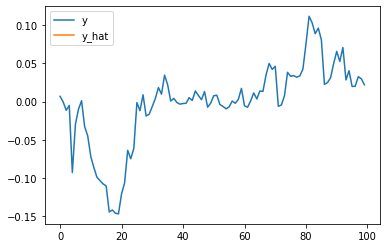

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=966, epochs=9.62, elapsed=0.23, elbo=nan loss=nan
i=967, epochs=9.63, elapsed=0.23, elbo=nan loss=nan
i=968, epochs=9.64, elapsed=0.23, elbo=nan loss=nan
i=969, epochs=9.65, elapsed=0.23, elbo=nan loss=nan
i=970, epochs=9.66, elapsed=0.23, elbo=nan loss=nan


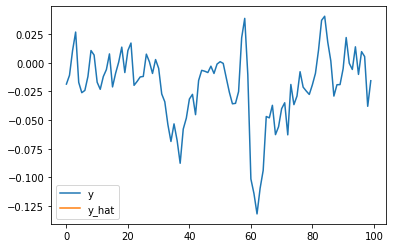

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=971, epochs=9.67, elapsed=0.23, elbo=nan loss=nan
i=972, epochs=9.68, elapsed=0.23, elbo=nan loss=nan
i=973, epochs=9.69, elapsed=0.23, elbo=nan loss=nan
i=974, epochs=9.70, elapsed=0.23, elbo=nan loss=nan
i=975, epochs=9.71, elapsed=0.23, elbo=nan loss=nan


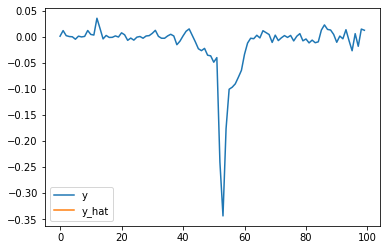

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=976, epochs=9.72, elapsed=0.23, elbo=nan loss=nan
i=977, epochs=9.73, elapsed=0.23, elbo=nan loss=nan
i=978, epochs=9.74, elapsed=0.23, elbo=nan loss=nan
i=979, epochs=9.75, elapsed=0.23, elbo=nan loss=nan
i=980, epochs=9.76, elapsed=0.23, elbo=nan loss=nan


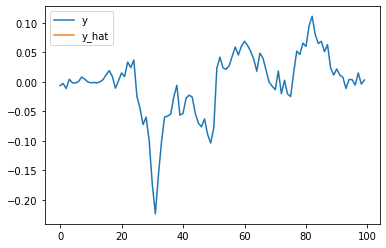

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=981, epochs=9.77, elapsed=0.23, elbo=nan loss=nan
i=982, epochs=9.78, elapsed=0.23, elbo=nan loss=nan
i=983, epochs=9.79, elapsed=0.23, elbo=nan loss=nan
i=984, epochs=9.80, elapsed=0.23, elbo=nan loss=nan
i=985, epochs=9.81, elapsed=0.23, elbo=nan loss=nan


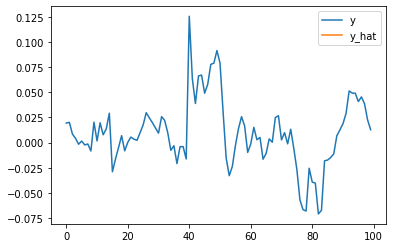

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=986, epochs=9.82, elapsed=0.23, elbo=nan loss=nan
i=987, epochs=9.83, elapsed=0.23, elbo=nan loss=nan
i=988, epochs=9.84, elapsed=0.23, elbo=nan loss=nan
i=989, epochs=9.85, elapsed=0.23, elbo=nan loss=nan
i=990, epochs=9.86, elapsed=0.23, elbo=nan loss=nan


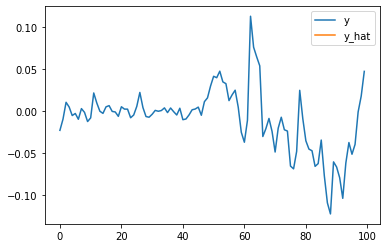

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=991, epochs=9.87, elapsed=0.23, elbo=nan loss=nan
i=992, epochs=9.88, elapsed=0.23, elbo=nan loss=nan
i=993, epochs=9.89, elapsed=0.24, elbo=nan loss=nan
i=994, epochs=9.90, elapsed=0.24, elbo=nan loss=nan
i=995, epochs=9.91, elapsed=0.24, elbo=nan loss=nan


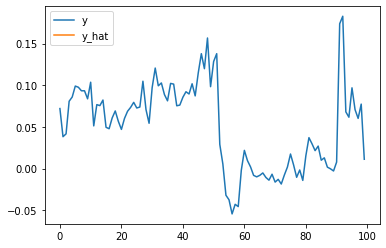

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=996, epochs=9.92, elapsed=0.24, elbo=nan loss=nan
i=997, epochs=9.93, elapsed=0.24, elbo=nan loss=nan
i=998, epochs=9.94, elapsed=0.24, elbo=nan loss=nan
i=999, epochs=9.95, elapsed=0.24, elbo=nan loss=nan
i=1000, epochs=9.96, elapsed=0.24, elbo=nan loss=nan


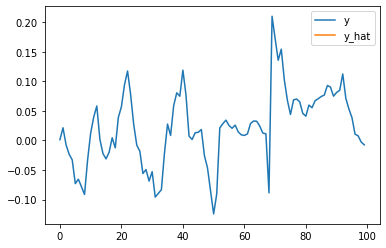

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1001, epochs=9.97, elapsed=0.24, elbo=nan loss=nan
i=1002, epochs=9.98, elapsed=0.24, elbo=nan loss=nan
i=1003, epochs=9.99, elapsed=0.24, elbo=nan loss=nan
i=1004, epochs=10.00, elapsed=0.24, elbo=nan loss=nan
i=1005, epochs=10.01, elapsed=0.24, elbo=nan loss=nan


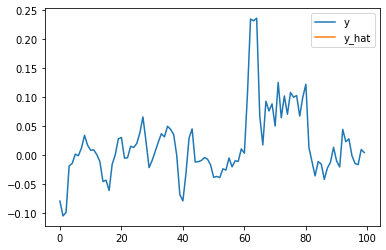

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1006, epochs=10.02, elapsed=0.24, elbo=nan loss=nan
i=1007, epochs=10.03, elapsed=0.24, elbo=nan loss=nan
i=1008, epochs=10.04, elapsed=0.24, elbo=nan loss=nan
i=1009, epochs=10.05, elapsed=0.24, elbo=nan loss=nan
i=1010, epochs=10.06, elapsed=0.24, elbo=nan loss=nan


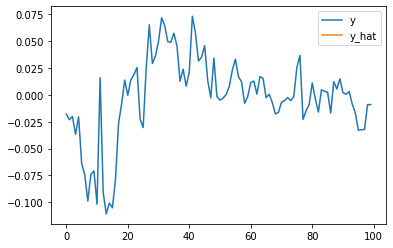

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1011, epochs=10.07, elapsed=0.24, elbo=nan loss=nan
i=1012, epochs=10.08, elapsed=0.24, elbo=nan loss=nan
i=1013, epochs=10.09, elapsed=0.24, elbo=nan loss=nan
i=1014, epochs=10.10, elapsed=0.24, elbo=nan loss=nan
i=1015, epochs=10.11, elapsed=0.24, elbo=nan loss=nan


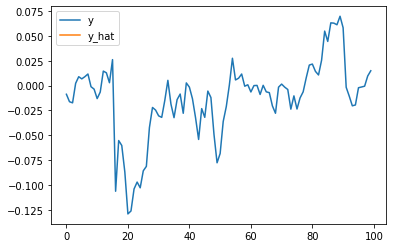

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1016, epochs=10.12, elapsed=0.24, elbo=nan loss=nan
i=1017, epochs=10.13, elapsed=0.24, elbo=nan loss=nan
i=1018, epochs=10.14, elapsed=0.24, elbo=nan loss=nan
i=1019, epochs=10.15, elapsed=0.24, elbo=nan loss=nan
i=1020, epochs=10.16, elapsed=0.24, elbo=nan loss=nan


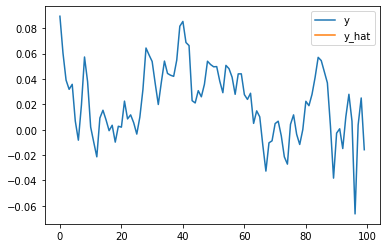

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1021, epochs=10.17, elapsed=0.24, elbo=nan loss=nan
i=1022, epochs=10.18, elapsed=0.24, elbo=nan loss=nan
i=1023, epochs=10.19, elapsed=0.24, elbo=nan loss=nan
i=1024, epochs=10.20, elapsed=0.24, elbo=nan loss=nan
i=1025, epochs=10.21, elapsed=0.24, elbo=nan loss=nan


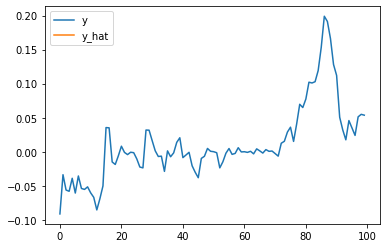

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1026, epochs=10.22, elapsed=0.24, elbo=nan loss=nan
i=1027, epochs=10.23, elapsed=0.24, elbo=nan loss=nan
i=1028, epochs=10.24, elapsed=0.24, elbo=nan loss=nan
i=1029, epochs=10.25, elapsed=0.24, elbo=nan loss=nan
i=1030, epochs=10.26, elapsed=0.24, elbo=nan loss=nan


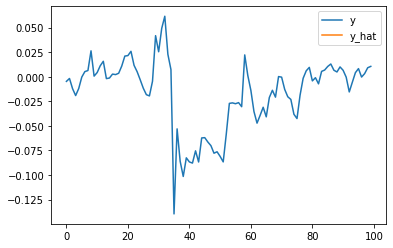

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1031, epochs=10.27, elapsed=0.24, elbo=nan loss=nan
i=1032, epochs=10.28, elapsed=0.24, elbo=nan loss=nan
i=1033, epochs=10.29, elapsed=0.24, elbo=nan loss=nan
i=1034, epochs=10.30, elapsed=0.24, elbo=nan loss=nan
i=1035, epochs=10.31, elapsed=0.25, elbo=nan loss=nan


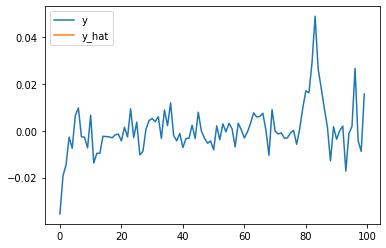

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1036, epochs=10.32, elapsed=0.25, elbo=nan loss=nan
i=1037, epochs=10.33, elapsed=0.25, elbo=nan loss=nan
i=1038, epochs=10.34, elapsed=0.25, elbo=nan loss=nan
i=1039, epochs=10.35, elapsed=0.25, elbo=nan loss=nan
i=1040, epochs=10.36, elapsed=0.25, elbo=nan loss=nan


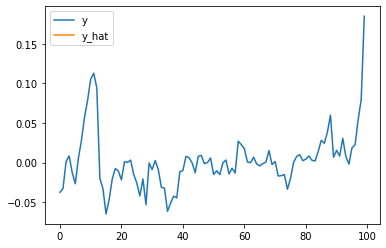

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1041, epochs=10.37, elapsed=0.25, elbo=nan loss=nan
i=1042, epochs=10.38, elapsed=0.25, elbo=nan loss=nan
i=1043, epochs=10.39, elapsed=0.25, elbo=nan loss=nan
i=1044, epochs=10.40, elapsed=0.25, elbo=nan loss=nan
i=1045, epochs=10.41, elapsed=0.25, elbo=nan loss=nan


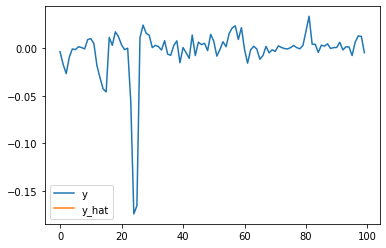

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1046, epochs=10.42, elapsed=0.25, elbo=nan loss=nan
i=1047, epochs=10.43, elapsed=0.25, elbo=nan loss=nan
i=1048, epochs=10.44, elapsed=0.25, elbo=nan loss=nan
i=1049, epochs=10.45, elapsed=0.25, elbo=nan loss=nan
i=1050, epochs=10.46, elapsed=0.25, elbo=nan loss=nan


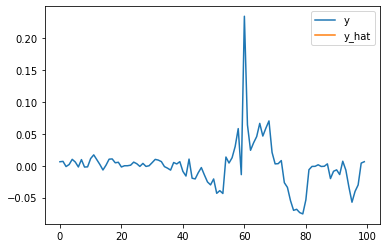

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1051, epochs=10.47, elapsed=0.25, elbo=nan loss=nan
i=1052, epochs=10.48, elapsed=0.25, elbo=nan loss=nan
i=1053, epochs=10.49, elapsed=0.25, elbo=nan loss=nan
i=1054, epochs=10.50, elapsed=0.25, elbo=nan loss=nan
i=1055, epochs=10.51, elapsed=0.25, elbo=nan loss=nan


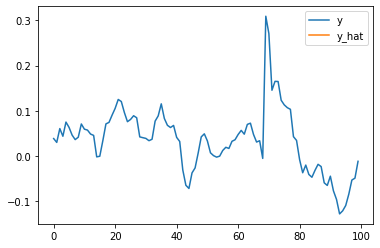

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1056, epochs=10.52, elapsed=0.25, elbo=nan loss=nan
i=1057, epochs=10.53, elapsed=0.25, elbo=nan loss=nan
i=1058, epochs=10.54, elapsed=0.25, elbo=nan loss=nan
i=1059, epochs=10.55, elapsed=0.25, elbo=nan loss=nan
i=1060, epochs=10.56, elapsed=0.25, elbo=nan loss=nan


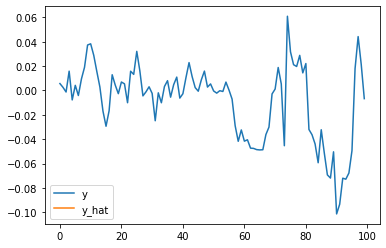

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1061, epochs=10.57, elapsed=0.25, elbo=nan loss=nan
i=1062, epochs=10.58, elapsed=0.25, elbo=nan loss=nan
i=1063, epochs=10.59, elapsed=0.25, elbo=nan loss=nan
i=1064, epochs=10.60, elapsed=0.25, elbo=nan loss=nan
i=1065, epochs=10.61, elapsed=0.25, elbo=nan loss=nan


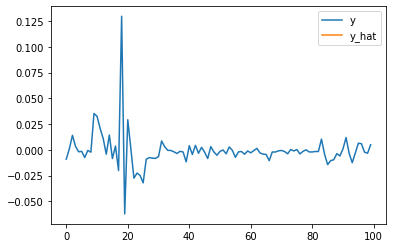

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1066, epochs=10.62, elapsed=0.25, elbo=nan loss=nan
i=1067, epochs=10.63, elapsed=0.25, elbo=nan loss=nan
i=1068, epochs=10.64, elapsed=0.25, elbo=nan loss=nan
i=1069, epochs=10.65, elapsed=0.25, elbo=nan loss=nan
i=1070, epochs=10.66, elapsed=0.25, elbo=nan loss=nan


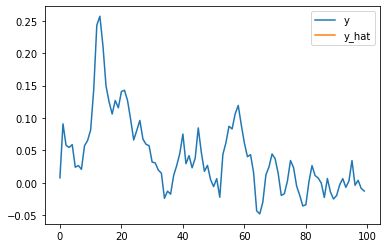

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1071, epochs=10.67, elapsed=0.25, elbo=nan loss=nan
i=1072, epochs=10.68, elapsed=0.25, elbo=nan loss=nan
i=1073, epochs=10.69, elapsed=0.25, elbo=nan loss=nan
i=1074, epochs=10.70, elapsed=0.25, elbo=nan loss=nan
i=1075, epochs=10.70, elapsed=0.25, elbo=nan loss=nan


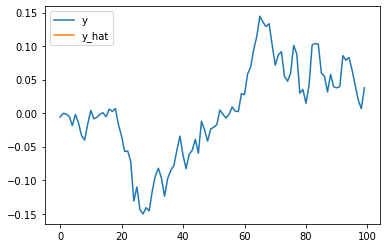

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1076, epochs=10.71, elapsed=0.25, elbo=nan loss=nan
i=1077, epochs=10.72, elapsed=0.26, elbo=nan loss=nan
i=1078, epochs=10.73, elapsed=0.26, elbo=nan loss=nan
i=1079, epochs=10.74, elapsed=0.26, elbo=nan loss=nan
i=1080, epochs=10.75, elapsed=0.26, elbo=nan loss=nan


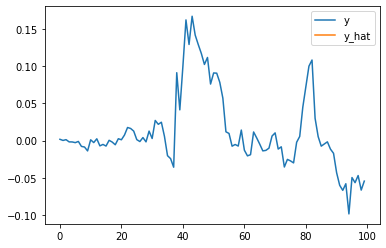

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1081, epochs=10.76, elapsed=0.26, elbo=nan loss=nan
i=1082, epochs=10.77, elapsed=0.26, elbo=nan loss=nan
i=1083, epochs=10.78, elapsed=0.26, elbo=nan loss=nan
i=1084, epochs=10.79, elapsed=0.26, elbo=nan loss=nan
i=1085, epochs=10.80, elapsed=0.26, elbo=nan loss=nan


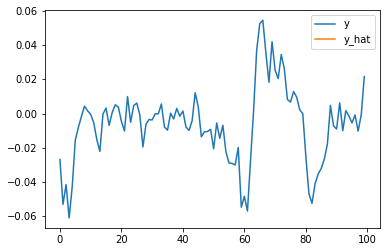

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1086, epochs=10.81, elapsed=0.26, elbo=nan loss=nan
i=1087, epochs=10.82, elapsed=0.26, elbo=nan loss=nan
i=1088, epochs=10.83, elapsed=0.26, elbo=nan loss=nan
i=1089, epochs=10.84, elapsed=0.26, elbo=nan loss=nan
i=1090, epochs=10.85, elapsed=0.26, elbo=nan loss=nan


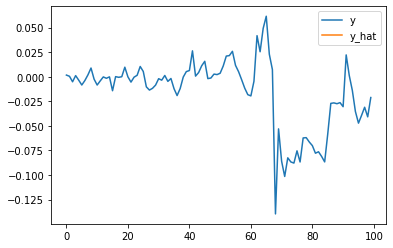

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1091, epochs=10.86, elapsed=0.26, elbo=nan loss=nan
i=1092, epochs=10.87, elapsed=0.26, elbo=nan loss=nan
i=1093, epochs=10.88, elapsed=0.26, elbo=nan loss=nan
i=1094, epochs=10.89, elapsed=0.26, elbo=nan loss=nan
i=1095, epochs=10.90, elapsed=0.26, elbo=nan loss=nan


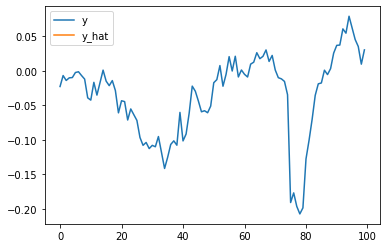

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1096, epochs=10.91, elapsed=0.26, elbo=nan loss=nan
i=1097, epochs=10.92, elapsed=0.26, elbo=nan loss=nan
i=1098, epochs=10.93, elapsed=0.26, elbo=nan loss=nan
i=1099, epochs=10.94, elapsed=0.26, elbo=nan loss=nan
i=1100, epochs=10.95, elapsed=0.26, elbo=nan loss=nan


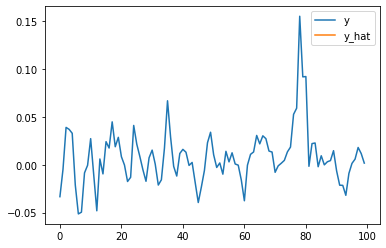

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1101, epochs=10.96, elapsed=0.26, elbo=nan loss=nan
i=1102, epochs=10.97, elapsed=0.26, elbo=nan loss=nan
i=1103, epochs=10.98, elapsed=0.26, elbo=nan loss=nan
i=1104, epochs=10.99, elapsed=0.26, elbo=nan loss=nan
i=1105, epochs=11.00, elapsed=0.26, elbo=nan loss=nan


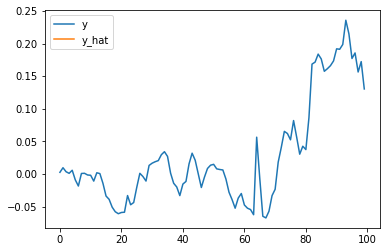

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1106, epochs=11.01, elapsed=0.26, elbo=nan loss=nan
i=1107, epochs=11.02, elapsed=0.26, elbo=nan loss=nan
i=1108, epochs=11.03, elapsed=0.26, elbo=nan loss=nan
i=1109, epochs=11.04, elapsed=0.26, elbo=nan loss=nan
i=1110, epochs=11.05, elapsed=0.26, elbo=nan loss=nan


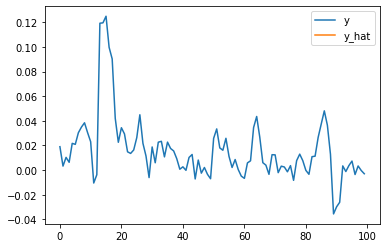

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1111, epochs=11.06, elapsed=0.26, elbo=nan loss=nan
i=1112, epochs=11.07, elapsed=0.26, elbo=nan loss=nan
i=1113, epochs=11.08, elapsed=0.26, elbo=nan loss=nan
i=1114, epochs=11.09, elapsed=0.26, elbo=nan loss=nan
i=1115, epochs=11.10, elapsed=0.26, elbo=nan loss=nan


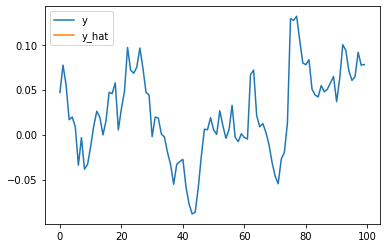

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1116, epochs=11.11, elapsed=0.26, elbo=nan loss=nan
i=1117, epochs=11.12, elapsed=0.26, elbo=nan loss=nan
i=1118, epochs=11.13, elapsed=0.26, elbo=nan loss=nan
i=1119, epochs=11.14, elapsed=0.27, elbo=nan loss=nan
i=1120, epochs=11.15, elapsed=0.27, elbo=nan loss=nan


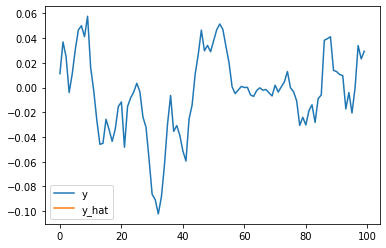

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1121, epochs=11.16, elapsed=0.27, elbo=nan loss=nan
i=1122, epochs=11.17, elapsed=0.27, elbo=nan loss=nan
i=1123, epochs=11.18, elapsed=0.27, elbo=nan loss=nan
i=1124, epochs=11.19, elapsed=0.27, elbo=nan loss=nan
i=1125, epochs=11.20, elapsed=0.27, elbo=nan loss=nan


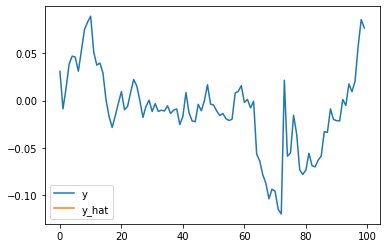

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1126, epochs=11.21, elapsed=0.27, elbo=nan loss=nan
i=1127, epochs=11.22, elapsed=0.27, elbo=nan loss=nan
i=1128, epochs=11.23, elapsed=0.27, elbo=nan loss=nan
i=1129, epochs=11.24, elapsed=0.27, elbo=nan loss=nan
i=1130, epochs=11.25, elapsed=0.27, elbo=nan loss=nan


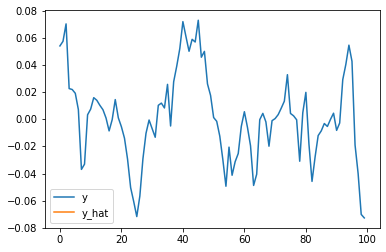

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_0'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_1'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_2'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/trace_struct.py:229: UserWarning: Encountered NaN: log_prob_sum at site 'z_3'
  warn_if_nan(site["log_prob_sum"], "log_prob_sum at site '{}'".format(name))
/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/poutine/t

/home/abhi/.conda/envs/envPyTorch/lib/python3.6/site-packages/pyro/infer/trace_elbo.py:145: UserWarning: Encountered NaN: loss
  warn_if_nan(loss, "loss")


i=1131, epochs=11.26, elapsed=0.27, elbo=nan loss=nan


KeyboardInterrupt: 

In [13]:
# Do inference.
pyro.poutine.util.enable_validation(True)
# pyro.clear_param_store()

for i in range(1, epochs+1):
    loss = svi.step(X=X, 
                    A=A, 
                    Y=Y, 
                    batch_size=batch_size)

    batch_loss, batch_Z, batch_Y_hat, batch_Y = vrnn.loss(X=X, A=A, Y=Y, batch_size=batch_size)
    print('i={}, epochs={:.2f}, elapsed={:.2f}, elbo={:.2f} loss={:.2f}'.format(
        i,
        (i * batch_size) / N,
        (time.time() - t0) / 3600,
        loss / N,
        batch_loss)
         )

    if i % 5 == 0:
        # compare_states(batch_Y[0], batch_Y_hat[0], overlap=True)            # animation of joints
        plot_velocity_curve(true=batch_Y[0, :, 0], pred=batch_Y_hat[0, :, 0]) # x-velocity
        # plot_velocity_curve(true=batch_Y[0, :, 1], pred=batch_Y_hat[0, :, 1]) # y-velocity
        # plot_velocity_curve(true=batch_Y[0, :, 2], pred=batch_Y_hat[0, :, 2]) # z-velocity

        # trace = poutine.trace(vrnn.guide).get_trace(X=X_example, A=A_example, Y=Y_example, batch_size=X_example.shape[0])
        # Y_hat_example, Z_example = poutine.replay(vrnn.prior, trace=trace)(X_example.shape[0])
        # print(Y_hat_example.shape)

In [17]:
vrnn.save(os.getcwd()+"/../models/bayesian_rnn_experimental.pth")_

AttributeError: 'BayesianSequenceModel' object has no attribute 'save'

In [14]:
batch_loss, batch_Z, batch_Y_hat, batch_Y = vrnn.loss(X=X, A=A, Y=Y, batch_size=batch_size)

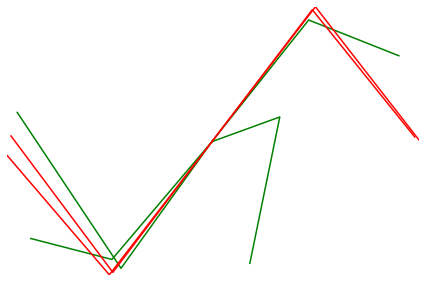

<Figure size 432x288 with 0 Axes>

In [16]:
compare_states(batch_Y[0], batch_Y_hat[0], overlap=True)            # animation of joints

<class 'matplotlib.axes._subplots.AxesSubplot'>


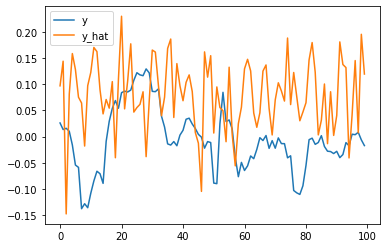

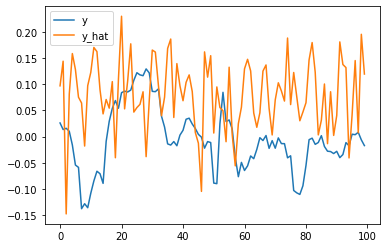

In [15]:
plot_velocity_curve(true=batch_Y[5, :, 0], pred=batch_Y_hat[1, :, 0]) # x-velocity

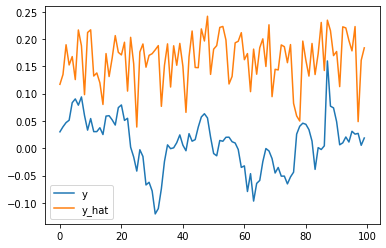

In [18]:
plot_velocity_curve(true=batch_Y[5, :, 1], pred=batch_Y_hat[1, :, 1]) # y-velocity

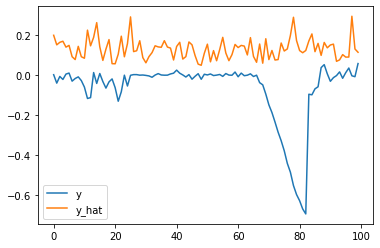

In [19]:
plot_velocity_curve(true=batch_Y[5, :, 2], pred=batch_Y_hat[1, :, 2]) # y-velocity

In [20]:
n = 0
t=1
Y_hat, O = vrnn.predict(X=X[n:n+1], A=A[n:n+1], Y=Y[n:n+1], lookahead=t)

In [21]:
Y_hat.shape, O.shape

((1, 100, 21), (1, 100, 21))

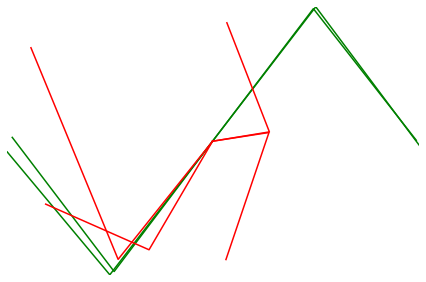

<Figure size 432x288 with 0 Axes>

In [22]:
compare_states(Y_hat[0], Y[n], overlap=True)            # animation of joints

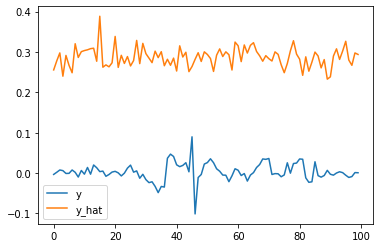

In [23]:
plot_velocity_curve(true=Y[n, :, 0].data.cpu().numpy(), pred=Y_hat[0, :, 0]) # x-velocity

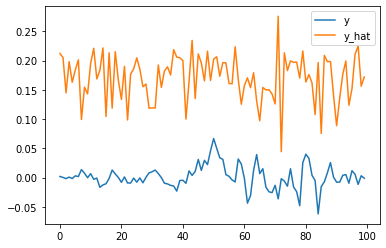

In [24]:
plot_velocity_curve(true=Y[n, :, 1].data.cpu().numpy(), pred=Y_hat[0, :, 1]) # y-velocity

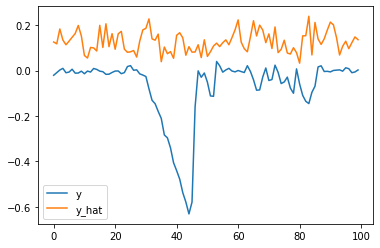

In [25]:
plot_velocity_curve(true=Y[n, :, 2].data.cpu().numpy(), pred=Y_hat[0, :, 2]) # z-velocity

In [57]:
# derive uncertainty
n = 0
t=10
Y_hats = np.array([vrnn.predict(X=X[n:n+1], A=A[n:n+1], Y=Y[n:n+1], lookahead=t)[1] for _ in range(100)])

0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1


0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1


0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1


0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1


0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1
0.1


In [58]:
v = torch.Tensor(Y_hats)

In [59]:
v.shape

torch.Size([100, 1, 100, 21])

In [60]:
site_stats = {
            "mean": torch.mean(v, 0),
            "std": torch.std(v, 0),
            "5%": v.kthvalue(int(len(v) * 0.05), dim=0)[0],
            "95%": v.kthvalue(int(len(v) * 0.95), dim=0)[0],
        }

In [61]:
site_stats["mean"].shape, site_stats["std"].shape, site_stats["5%"].shape, site_stats["95%"].shape,

(torch.Size([1, 100, 21]),
 torch.Size([1, 100, 21]),
 torch.Size([1, 100, 21]),
 torch.Size([1, 100, 21]))

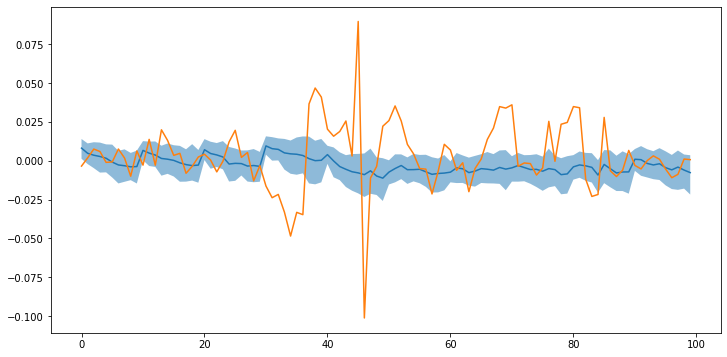

In [62]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 0].data.cpu().numpy(), pred=site_stats["mean"][0, :, 0].data.cpu().numpy(), error1=site_stats["5%"][0, :, 0], error2=site_stats["95%"][0, :, 0].data.cpu().numpy()) # z-velocity

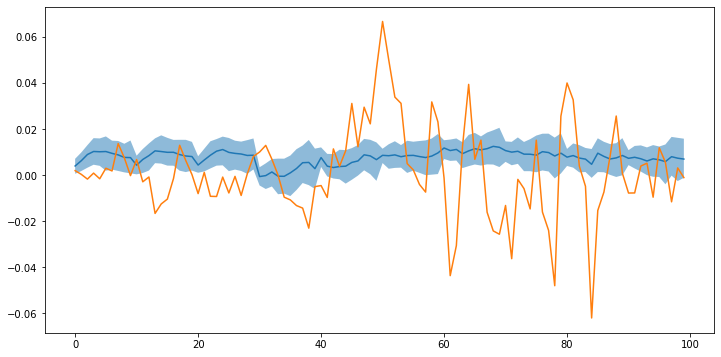

In [63]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 1].data.cpu().numpy(), pred=site_stats["mean"][0, :, 1].data.cpu().numpy(), error1=site_stats["5%"][0, :, 1].data.cpu().numpy(), error2=site_stats["95%"][0, :, 1].data.cpu().numpy()) # z-velocity

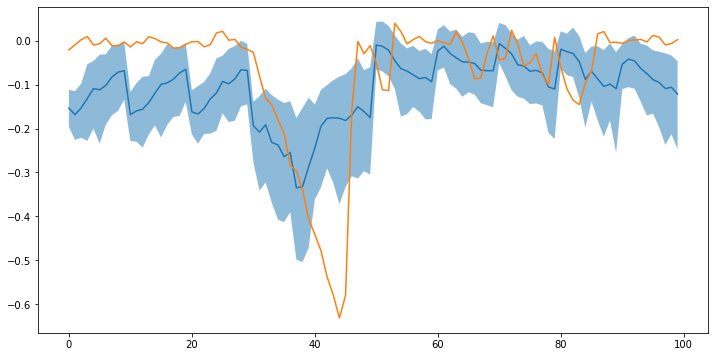

In [64]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 2].data.cpu().numpy(), pred=site_stats["mean"][0, :, 2].data.cpu().numpy(), error1=site_stats["5%"][0, :, 2].data.cpu().numpy(), error2=site_stats["95%"][0, :, 2].data.cpu().numpy()) # z-velocity

In [130]:
# derive uncertainty
n = 0
t=1
Y_hats = np.array([vrnn.predict(X=X[n:n+1], A=A[n:n+1], Y=Y[n:n+1], lookahead=t)[0] for _ in range(100)])

In [131]:
v = torch.Tensor(Y_hats)

In [132]:
site_stats = {
            "mean": torch.mean(v, 0),
            "std": torch.std(v, 0),
            "5%": v.kthvalue(int(len(v) * 0.05), dim=0)[0],
            "95%": v.kthvalue(int(len(v) * 0.95), dim=0)[0],
        }

In [133]:
site_stats["mean"].shape, site_stats["std"].shape, site_stats["5%"].shape, site_stats["95%"].shape,

(torch.Size([1, 100, 21]),
 torch.Size([1, 100, 21]),
 torch.Size([1, 100, 21]),
 torch.Size([1, 100, 21]))

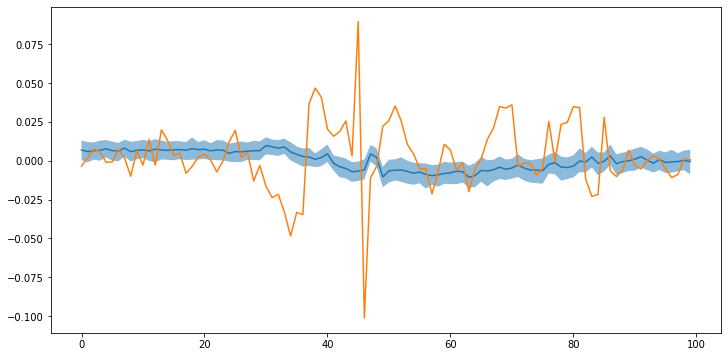

In [134]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 0].data.cpu().numpy(), pred=site_stats["mean"][0, :, 0].data.cpu().numpy(), error1=site_stats["5%"][0, :, 0], error2=site_stats["95%"][0, :, 0].data.cpu().numpy()) # z-velocity

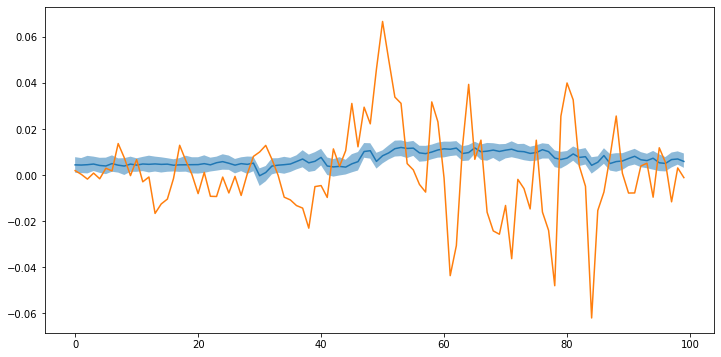

In [135]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 1].data.cpu().numpy(), pred=site_stats["mean"][0, :, 1].data.cpu().numpy(), error1=site_stats["5%"][0, :, 1].data.cpu().numpy(), error2=site_stats["95%"][0, :, 1].data.cpu().numpy()) # z-velocity

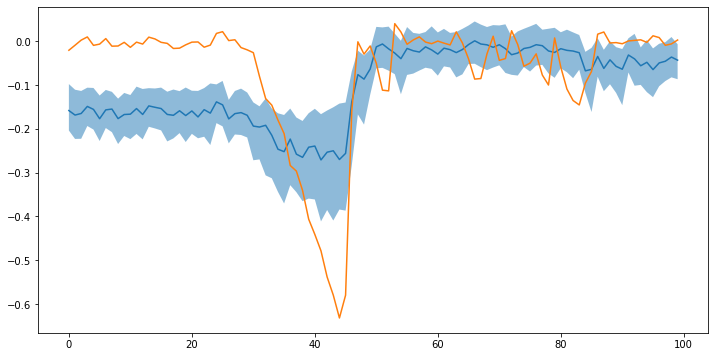

In [136]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 2].data.cpu().numpy(), pred=site_stats["mean"][0, :, 2].data.cpu().numpy(), error1=site_stats["5%"][0, :, 2].data.cpu().numpy(), error2=site_stats["95%"][0, :, 2].data.cpu().numpy()) # z-velocity

In [137]:
Y_hats.shape

(100, 1, 100, 21)

In [30]:
Y_hats[0] == Y_hats[1] # this is because each prediction is stochastic

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])

In [31]:
Y_hats[0].shape

(1, 100, 21)

In [32]:
mu = np.mean(Y_hats, axis=0)
std = np.std(Y_hats, axis=0)

In [33]:
mu.shape, std.shape

((1, 100, 21), (1, 100, 21))

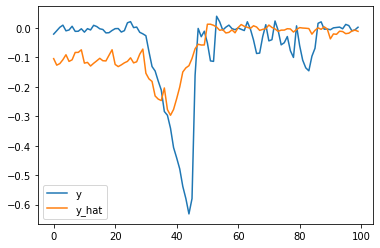

In [34]:
plot_velocity_curve(true=Y[n, :, 2].data.cpu().numpy(), pred=mu[0, :, 2]) # z-velocity

In [43]:
mu_less_std = mu-2*std

In [44]:
mu_less_std.shape

(1, 100, 21)

In [45]:
mu_more_std = mu+2*std

In [46]:
mu_more_std.shape

(1, 100, 21)

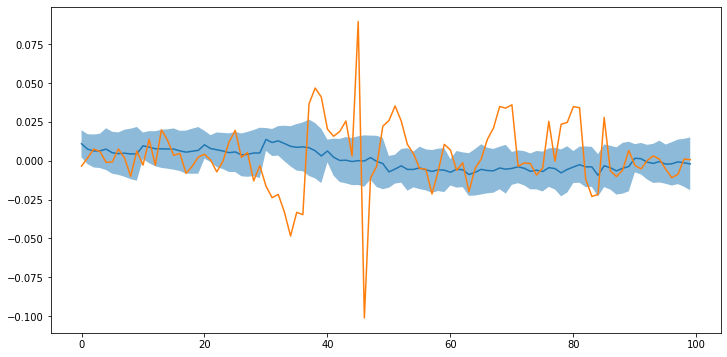

In [47]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 0].data.cpu().numpy(), pred=mu[0, :, 0], error1=mu_less_std[0, :, 0], error2=mu_more_std[0, :, 0]) # z-velocity

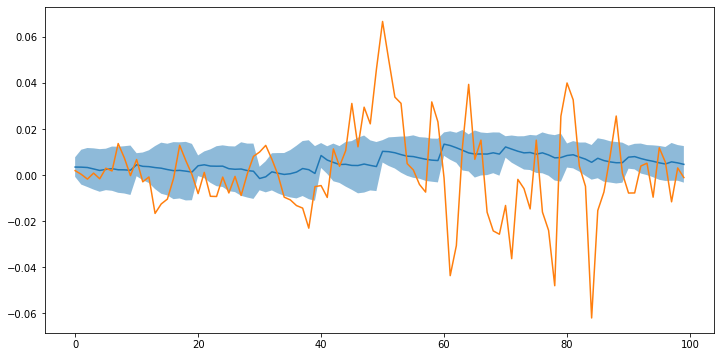

In [48]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 1].data.cpu().numpy(), pred=mu[0, :, 1], error1=mu_less_std[0, :, 1], error2=mu_more_std[0, :, 1]) # z-velocity

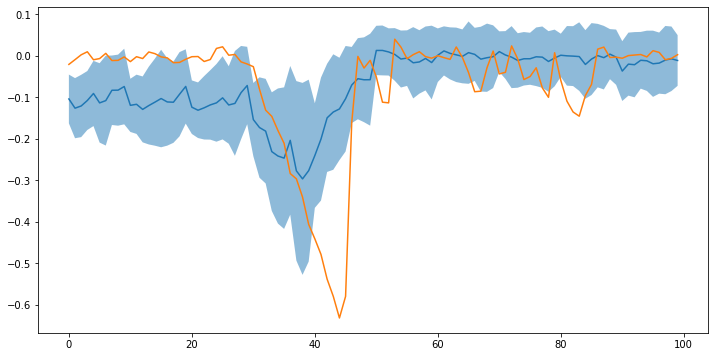

In [49]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 2].data.cpu().numpy(), pred=mu[0, :, 2], error1=mu_less_std[0, :, 2], error2=mu_more_std[0, :, 2]) # z-velocity

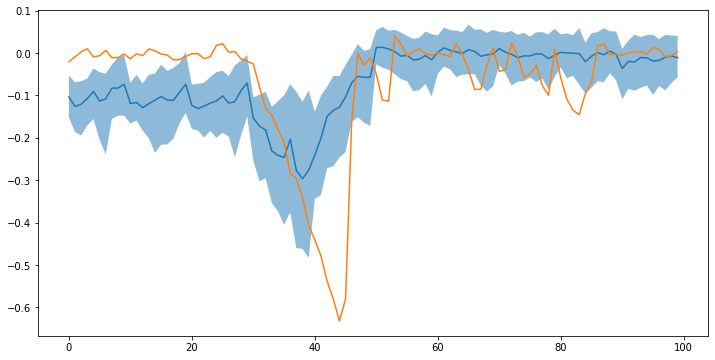

In [50]:
plot_velocity_curve_with_uncertainty_shaded(true=Y[n, :, 2].data.cpu().numpy(), pred=site_stats["mean"][0, :, 2].data.cpu().numpy(), error1=site_stats["5%"][0, :, 2].data.cpu().numpy(), error2=site_stats["95%"][0, :, 2].data.cpu().numpy()) # z-velocity